In [1]:
%load_ext autoreload 
%autoreload 2
%matplotlib inline
import json, os, cv2
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm import tqdm
from scipy.interpolate import interp1d
from scipy import signal
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.cluster import KMeans
import matplotlib.colors as mcolors
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.gridspec import GridSpec
import glob 
import seaborn as sns
from brokenaxes import brokenaxes
from frechetdist import frdist
from scipy.ndimage import gaussian_filter
from dipy.segment.metricspeed import AveragePointwiseEuclideanMetric
import ast
import scipy.stats as stats
from scipy.stats import f_oneway


import sys
sys.path.insert(0, 'C:/Users/nlab/Documents/GitHub/obstacle_avoidance')

import warnings
warnings.filterwarnings('ignore')
from streamline_clustering.clustering import pair_elements,create_streamlines
from src.base import BaseInput
from src.topcam import Topcam
from src.utils.auxiliary import find_index_in_list,flatten_series
from pipeline.helper_functions import list_columns,interpolate_array,flatten_list_of_arrays,calculate_quartiles,create_df_by_type,split_range_into_parts,get_mean_of_df,get_median_of_df,drop_nans_in_columns,create_consective_df_new,assign_date_index,symmetrize_y_axis,edge_outliers,create_df_by_type_nostart,find_consecutive_repeats,largest_sequentially_increasing_by_one_subarray,create_color_dict,smooth,create_monotonic_array,correct_trace
from pipeline.oa_calculations import distance_calcs,heading_calcs,cluster_obstacle,calculate_distances,df_tortuosity,calculate_speed,deveation,lateral_error,start,redo_ts_trace,compute_tortuosity,angular_velocity_head,turn_direction,turn_to_obstacle,get_head_angle,head_angle_velocity,intial_lateral_error,avg_lateral_error,check_trial_for_obstalce_cross_df,distance_at_head_turn,zero_out_angle_target_port,angular_velocity_head_corner,intial_distance_to_obstacle,last_occurrence_indices
from pipeline.oa_plotting_funcs import plot_arena,plot_orginal_obstacle,plot_obstacle_from_row
from pipeline.batch_process_oa import plot_oa

Loading DLC 2.3.0...
DLC loaded in light mode; you cannot use any GUI (labeling, relabeling and standalone GUI)


In [2]:
def distance_at_head_turn_2(df):
    for ind,row in df.iterrows():
        peaks, prop = find_peaks(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]), width=2,height=(3,12))
        if len(peaks) == 0:
            df.at[ind,'distance_at_head_turn_2'] = np.nan
            df.at[ind,'angle_at_head_turn_2'] = np.nan
            df.at[ind,'num_turn'] = 0
        else:
            max_peak = peaks[prop['peak_heights'].argmax()]
  
            df.at[ind,'distance_at_head_turn_2'] = row.ts_distance_from_edge[:int(row.obstacle_ind)][max_peak]
            df.at[ind,'distance_at_head_turn_2_index'] = max_peak
            df.at[ind,'angle_at_head_turn_2'] = row.ts_angle_to_corner[:int(row.obstacle_ind)][max_peak]
            df.at[ind,'num_turn'] = len(peaks)

In [3]:
def distance_at_head_turn_2(df):
    for ind,row in df.iterrows():
        peaks, prop = find_peaks(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]), width=2,height=(3,12))
        if len(peaks) == 0:
            df.at[ind,'distance_at_head_turn_2'] = np.nan
            df.at[ind,'distance_at_head_turn_2_index'] = np.nan
            df.at[ind,'distance_at_head_turn_2_indexs'] = np.nan
            df.at[ind,'angle_at_head_turn_2'] = np.nan
            df.at[ind,'num_turn'] = 0
        else:
            max_peak = peaks[prop['peak_heights'].argmax()]
  
            df.at[ind,'distance_at_head_turn_2'] = row.ts_distance_from_edge[:int(row.obstacle_ind)][max_peak]
            df.at[ind,'distance_at_head_turn_2_index'] = max_peak
            df.at[ind,'distance_at_head_turn_2_indexs'] = np.array(peaks).astype(object)
            df.at[ind,'angle_at_head_turn_2'] = row.ts_angle_to_corner[:int(row.obstacle_ind)][max_peak]
            df.at[ind,'num_turn'] = len(peaks)

In [4]:
def right_left_turns(df):
    for ind,row in df.iterrows():
        pos_peaks, pos_prop = find_peaks(row.head_angle_velocity[:int(row.obstacle_ind)], width=2,height=(3,12))
        neg_peaks, neg_prop = find_peaks(row.head_angle_velocity[:int(row.obstacle_ind)]*-1, width=2,height=(3,12))
        
        if row.odd == 'right':
            df.at[ind,'right_num_turn'] = len(neg_peaks)
            df.at[ind,'right_turns_distances'] = row.ts_distance_from_edge[:int(row.obstacle_ind)][neg_peaks]
            df.at[ind,'left_num_turn'] = len(pos_peaks)
            df.at[ind,'left_turns_distances'] = row.ts_distance_from_edge[:int(row.obstacle_ind)][pos_peaks]
        elif row.odd == 'left':
            df.at[ind,'right_num_turn'] = len(pos_peaks)
            df.at[ind,'right_turns_distances'] = row.ts_distance_from_edge[:int(row.obstacle_ind)][pos_peaks]
            df.at[ind,'left_num_turn'] = len(neg_peaks)
            df.at[ind,'left_turns_distances'] = row.ts_distance_from_edge[:int(row.obstacle_ind)][neg_peaks]

In [516]:
np.median(left_turn_dists_monre[left_turn_dists_monre>0])

11.709338749795847

In [473]:
neg_peaks[0]

56

In [463]:
row.right_num_turn

0.0

In [6]:
def right_left_ratio(df):
    for ind,row in df.iterrows():
        if row.num_turn == 0:
            continue
        else:
            df.at[ind,'right_turn_ratio'] = row.right_num_turn/row.num_turn
            df.at[ind,'left_turn_ratio'] = row.left_num_turn/row.num_turn

In [7]:
def towards_away_turns(df):
    for ind,row in df.iterrows():
        pos_peaks, pos_prop = find_peaks(row.head_corner_angle_velocity[:int(row.obstacle_ind)], width=2,height=(3,12))
        neg_peaks, neg_prop = find_peaks((row.head_corner_angle_velocity[:int(row.obstacle_ind)]*-1), width=2,height=(3,12))
        #if len(pos_peaks) == 0:
        #    df.at[ind,'towards_num_turn'] = 0
        #elif len(neg_peaks) == 0: 
        #    df.at[ind,'away_num_turn'] = 0  
        #else:
        df.at[ind,'towards_num_turn'] = len(pos_peaks)
        df.at[ind,'away_num_turn'] = len(neg_peaks)

In [8]:
oa_session = plot_oa(r"D:\obstacle_avoidance\metadata\J675\oa_monle.json",'blank')
oa_session.gather_session_df('obstacle',6)
mon = oa_session.df
get_head_angle(mon)
head_angle_velocity(mon)
turn_direction(mon)
turn_to_obstacle(mon)
mon = drop_nans_in_columns(mon,'obstacle_ind')
angular_velocity_head_corner(mon)
towards_away_turns(mon)
distance_at_head_turn_2(mon)
heading_calcs(mon)
right_left_turns(mon)
right_left_ratio(mon)
calculate_speed(mon)
mon['task_com'] = 'mon'
mon_long_nostart,mon_short_nostart,mon_middle_nostart = create_df_by_type_nostart(mon)

6
corner
port


In [197]:
mon_long_nostart,mon_short_nostart,mon_middle_nostart = create_df_by_type_nostart(mon)

In [9]:
oa_session = plot_oa(r"D:\obstacle_avoidance\metadata\J675\oa_J675__late.json",'blank')
oa_session.gather_session_df('obstacle',6)
con = oa_session.df
get_head_angle(con)
head_angle_velocity(con)
turn_direction(con)
turn_to_obstacle(con)
con = drop_nans_in_columns(con,'obstacle_ind')
angular_velocity_head_corner(con)
towards_away_turns(con)
distance_at_head_turn_2(con)
heading_calcs(con)
right_left_turns(con)
#right_left_ratio(con)
con['task_com'] = 'oa'
con_long_nostart,con_short_nostart,con_middle_nostart = create_df_by_type_nostart(con)

6
corner
port


In [8]:
oa_session = plot_oa(r"D:\obstacle_avoidance\metadata\J675\oa_J675__late.json",'blank')
oa_session.gather_session_df('obstacle',6)
light = oa_session.df
get_head_angle(light)
head_angle_velocity(light)
turn_direction(light)
turn_to_obstacle(light)
light = drop_nans_in_columns(light,'obstacle_ind')
angular_velocity_head_corner(light)
towards_away_turns(light)
distance_at_head_turn_2(light)
heading_calcs(light)
right_left_turns(light)
right_left_ratio(light)
light['task_com'] = 'oa'
light_long_nostart,light_short_nostart,light_middle_nostart = create_df_by_type_nostart(light)

6
corner
port


In [11]:
test = mon[(mon.animal == 'J675NN') & (mon.date == '022124')]

<AxesSubplot: ylabel='right_turn_ratio'>

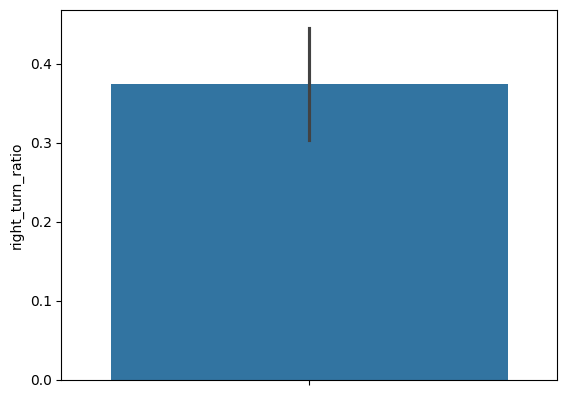

In [12]:
sns.barplot(data = test, y = 'right_turn_ratio')

<AxesSubplot: ylabel='left_turn_ratio'>

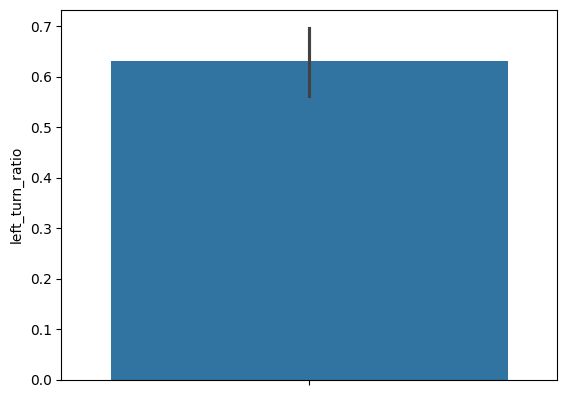

In [13]:
sns.barplot(data = test, y = 'left_turn_ratio')

<AxesSubplot: xlabel='away_num_turn', ylabel='Proportion'>

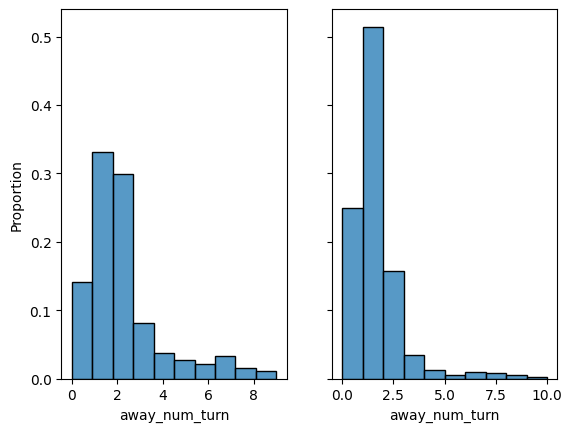

In [381]:
fig,ax = plt.subplots(1,2,sharey=True)


sns.histplot(ax =ax[0], data = light[light.away_num_turn<=10],x = 'away_num_turn',stat='proportion',bins=10)
sns.histplot(ax =ax[1], data = mon[mon.away_num_turn<=10],x = 'away_num_turn',stat='proportion',bins=10)

In [198]:
light_long_nostart,light_short_nostart,light_middle_nostart = create_df_by_type_nostart(light)
mon_long_nostart,mon_short_nostart,mon_middle_nostart = create_df_by_type_nostart(mon)

<AxesSubplot: xlabel='task', ylabel='left_num_turn'>

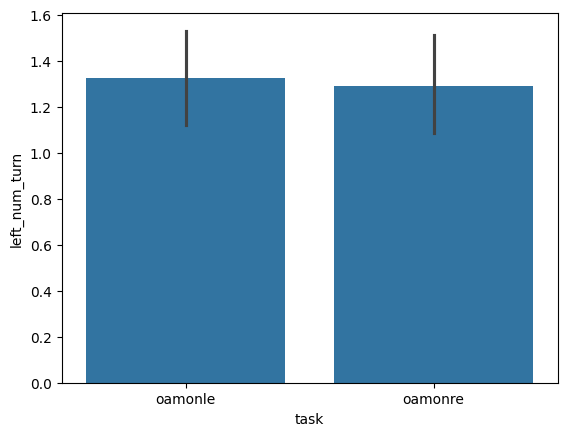

In [115]:
sns.barplot(data = mon[mon.right_num_turn<=10],x = 'task',y ='left_num_turn')

In [79]:
light_long_nostart,light_short_nostart,light_middle_nostart = create_df_by_type_nostart(light)

<AxesSubplot: xlabel='num_turn', ylabel='Proportion'>

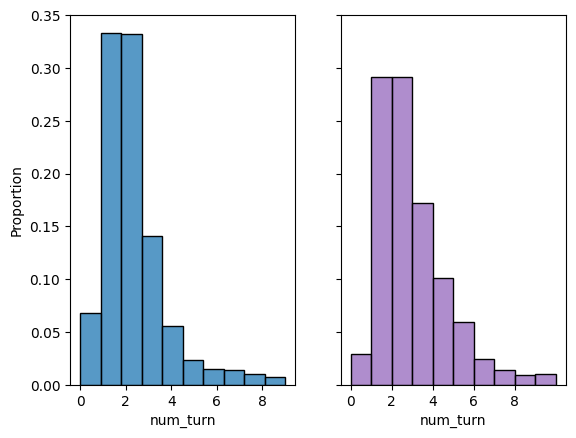

In [22]:
fig,ax  = plt.subplots(1,2,sharey=True)
ax[0].set_xticks([0,2,4,6,8])
ax[1].set_xticks([0,2,4,6,8])
sns.histplot (ax =ax[0], data = con[(con.num_turn <= 10)]  ,x = 'num_turn',stat='proportion',bins=10) 
sns.histplot (ax =ax[1], data = mon[(mon.num_turn <= 10)]    ,x = 'num_turn',stat='proportion',color ='tab:purple',bins=10) 



<AxesSubplot: xlabel='time', ylabel='Proportion'>

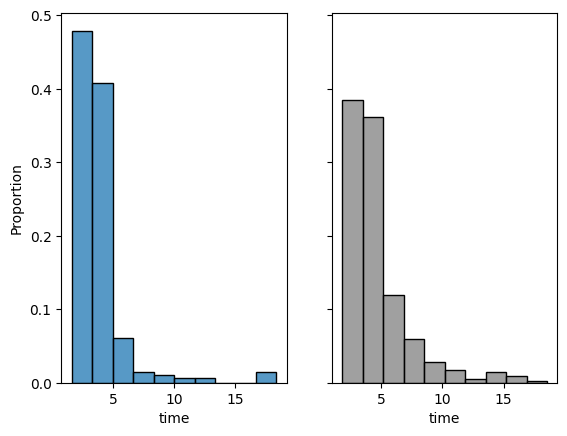

In [28]:
fig,ax  = plt.subplots(1,2,sharey=True)
#ax[0].set_xticks([0,2,4,6,8])
#ax[1].set_xticks([0,2,4,6,8])
sns.histplot (ax =ax[0], data = light_long_nostart[light_long_nostart.time <= 20]  ,x = 'time',stat='proportion',bins=10) 
sns.histplot (ax =ax[1], data = mon_long_nostart[mon_long_nostart.time <= 20]   ,x = 'time',stat='proportion',color ='grey',bins=10) 

<AxesSubplot: xlabel='num_turn', ylabel='Proportion'>

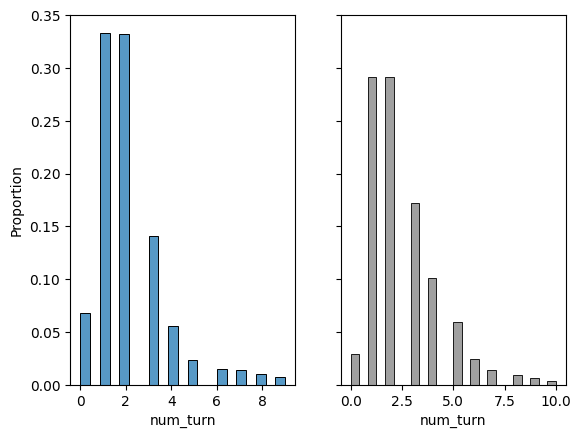

In [319]:
fig,ax  = plt.subplots(1,2,sharey=True)
sns.histplot (ax =ax[0], data = light[light.num_turn <= 10]  ,x = 'num_turn',stat='proportion') 
sns.histplot (ax =ax[1], data = mon[mon.num_turn <= 10]   ,x = 'num_turn',stat='proportion',color ='grey') 

<AxesSubplot: xlabel='time', ylabel='Proportion'>

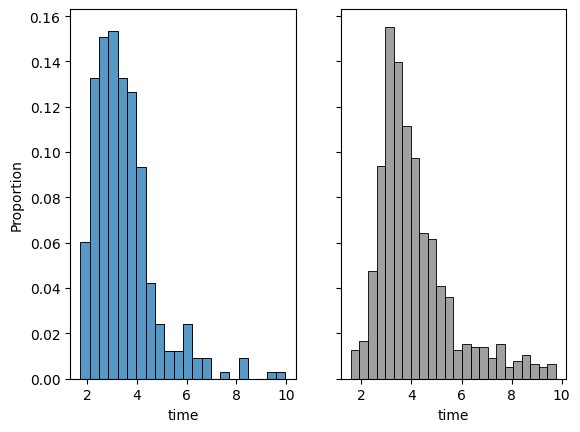

In [357]:
fig,ax  = plt.subplots(1,2,sharey=True)
sns.histplot (ax =ax[0], data = light[light.time <= 10]  ,x = 'time',stat='proportion') 
sns.histplot (ax =ax[1], data = mon[mon.time <= 10]   ,x = 'time',stat='proportion',color ='grey') 

<ErrorbarContainer object of 3 artists>

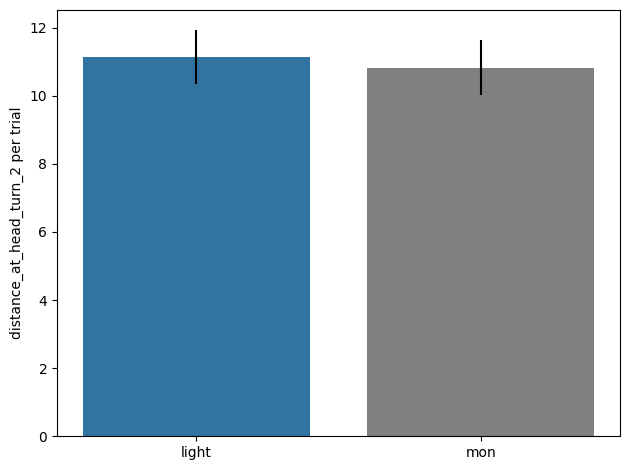

In [332]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light,mon]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
light = data[data.task == 'oa']
light = light[light.time<=10]
dark = data[data.task_com == 'mon']
dark = dark[dark.time<=10]
data =  pd.concat([light,dark]) 

sns.barplot(ax = ax, data = data ,x='task_com' ,y = 'distance_at_head_turn_2',hue = 'task_com',estimator = 'mean',palette=['tab:blue','grey'],ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('distance_at_head_turn_2 per trial')
ax.set_xlabel('')
ax.set_xticks([0,1],['light','mon'])


light = data[data.task == 'oa']
light = light[light.time<=10]
light_mean = light.distance_at_head_turn_2.mean()
light_after= np.nanstd(light.groupby(['animal']).distance_at_head_turn_2.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).distance_at_head_turn_2.mean().to_numpy()))

dark = data[data.task_com == 'mon']
dark = dark[dark.time<=10]
dark_mean = dark.distance_at_head_turn_2.mean()
dark_after= np.nanstd(dark.groupby(['animal']).distance_at_head_turn_2.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).distance_at_head_turn_2.mean().to_numpy()))

ax.errorbar([0,1],[light_mean,dark_mean] , yerr=[light_after,dark_after], ls='none' ,color="black")

In [1]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light,mon]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
light = data[data.task == 'oa']
light = light[light.time<=10]
dark = data[data.task_com == 'mon']
dark = dark[dark.time<=10]
data =  pd.concat([light,dark]) 

sns.barplot(ax = ax, data = data ,x='task_com' ,y = 'num_turn',hue = 'task_com',estimator = 'mean',palette=['tab:blue','grey'],ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('num_turn per trial')
ax.set_xlabel('')
ax.set_xticks([0,1],['light','mon'])


light = data[data.task == 'oa']
light = light[light.time<=10]
light_mean = light.num_turn.mean()
light_after= np.nanstd(light.groupby(['animal']).num_turn.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).num_turn.mean().to_numpy()))

dark = data[data.task_com == 'mon']
dark = dark[dark.time<=10]
dark_mean = dark.num_turn.mean()
dark_after= np.nanstd(dark.groupby(['animal']).num_turn.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).num_turn.mean().to_numpy()))

ax.errorbar([0,1],[light_mean,dark_mean] , yerr=[light_after,dark_after], ls='none' ,color="black")

NameError: name 'plt' is not defined

<ErrorbarContainer object of 3 artists>

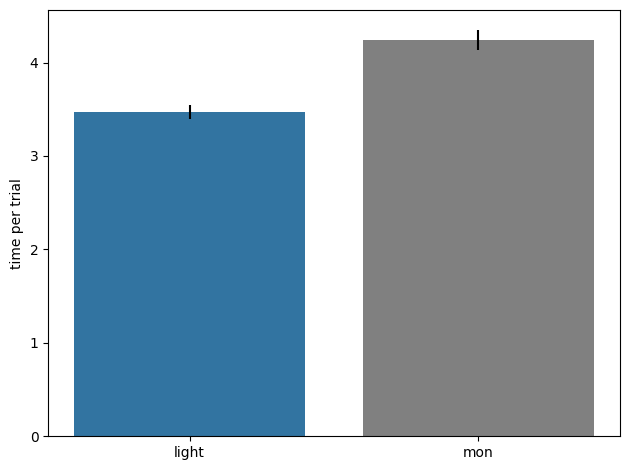

In [18]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([con,mon]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
light = data[data.task == 'oa']
light = light[light.time<=10]
dark = data[data.task_com == 'mon']
dark = dark[dark.time<=10]
data =  pd.concat([light,dark]) 

sns.barplot(ax = ax, data = data ,x='task_com' ,y = 'time',hue = 'task_com',estimator = 'mean',palette=['tab:blue','grey'],ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('time per trial')
ax.set_xlabel('')
ax.set_xticks([0,1],['light','mon'])


light = data[data.task == 'oa']
light = light[light.time<=10]
light_mean = light.time.mean()
light_after= np.nanstd(light.groupby(['animal']).time.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).time.mean().to_numpy()))

dark = data[data.task_com == 'mon']
dark = dark[dark.time<=10]
dark_mean = dark.time.mean()
dark_after= np.nanstd(dark.groupby(['animal']).time.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).time.mean().to_numpy()))

ax.errorbar([0,1],[light_mean,dark_mean] , yerr=[light_after,dark_after], ls='none' ,color="black")

<ErrorbarContainer object of 3 artists>

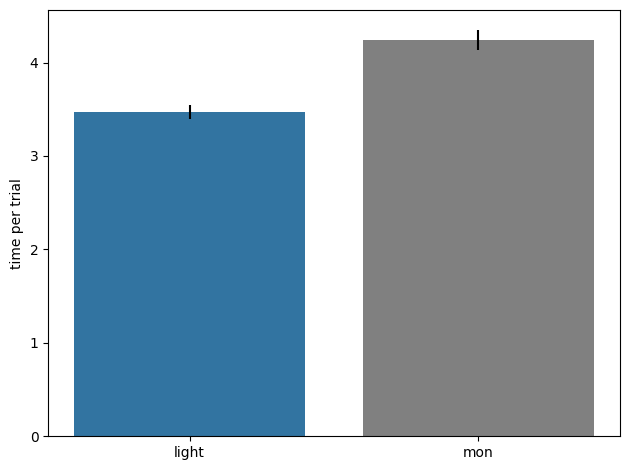

In [327]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light,mon]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
light = data[data.task == 'oa']
light = light[light.time<=10]
dark = data[data.task_com == 'mon']
dark = dark[dark.time<=10]
data =  pd.concat([light,dark]) 

sns.barplot(ax = ax, data = data ,x='task_com' ,y = 'time',hue = 'task_com',estimator = 'mean',palette=['tab:blue','grey'],ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('time per trial')
ax.set_xlabel('')
ax.set_xticks([0,1],['light','mon'])


light = data[data.task == 'oa']
light = light[light.time<=10]
light_mean = light.time.mean()
light_after= np.nanstd(light.groupby(['animal']).time.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).time.mean().to_numpy()))

dark = data[data.task_com == 'mon']
dark = dark[dark.time<=10]
dark_mean = dark.time.mean()
dark_after= np.nanstd(dark.groupby(['animal']).time.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).time.mean().to_numpy()))

ax.errorbar([0,1],[light_mean,dark_mean] , yerr=[light_after,dark_after], ls='none' ,color="black")


In [12]:
light

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,std_interp_ts_nose_y_cm,mad_interp_ts_nose_y_cm,animal_mean_interp_ts_nose_y_cm,animal_median_interp_ts_nose_y_cm,animal_std_interp_ts_nose_y_cm,animal_mad_interp_ts_nose_y_cm,date_mean_interp_ts_nose_y_cm,date_median_interp_ts_nose_y_cm,date_std_interp_ts_nose_y_cm,date_mad_interp_ts_nose_y_cm
0,0,1.0,48460.803673,48463.098073,"[48460.813056, 48460.829721, 48460.846144, 484...","[[361, 362, 363, 364, 365, 366, 367, 368, 369,...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[646.9893798828125, 648.048828125, 648.6989746...","[231.874755859375, 233.19113159179688, 233.978...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2.0,48463.098073,48467.230848,"[48463.113651, 48463.130342, 48463.147648, 484...","[499, 500, 501, 502, 503, 504, 505, 506, 507, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[85.19378662109375, 85.10543823242188, 84.6010...","[246.13662719726562, 246.3499298095703, 246.79...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,7.0,48481.346995,48485.025369,"[48481.353216, 48481.369843, 48481.387724, 484...","[1593, 1594, 1595, 1596, 1597, 1598, 1599, 160...","[76.56636810302734, 76.11477661132812, 75.4563...","[231.91342163085938, 231.06004333496094, 232.0...","[82.81084442138672, 82.71328735351562, 82.2345...","[248.85110473632812, 248.27322387695312, 249.0...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,9.0,48487.192371,48490.338393,"[48487.205401, 48487.223027, 48487.238617, 484...","[1944, 1945, 1946, 1947, 1948, 1949, 1950, 195...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[82.9719467163086, 82.52574920654297, 82.13500...","[248.79286193847656, 249.23333740234375, 248.5...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,10.0,48490.338393,48493.492569,"[48490.339814, 48490.357299, 48490.373068, 484...","[[2132, 2133, 2134, 2135, 2136, 2137, 2138, 21...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[645.517578125, 646.970458984375, 647.92138671...","[239.50331115722656, 238.91883850097656, 239.0...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330,330,100.0,47726.510169,47731.917222,"[47726.523276, 47726.540044, 47726.556595, 477...","[28480, 28481, 28482, 28483, 28484, 28485, 284...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[98.9370346069336, 97.78596496582031, 96.23490...","[234.21372985839844, 235.86767578125, 236.0280...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
331,331,101.0,47731.917222,47738.086310,"[47731.925004, 47731.942707, 47731.958412, 477...","[[28804, 28805, 28806, 28807, 28808, 28809, 28...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[644.8927001953125, 646.4306640625, 647.464904...","[249.8226318359375, 249.70423889160156, 249.12...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
332,332,103.0,47743.661516,47748.617984,"[47743.662592, 47743.680691, 47743.695833, 477...","[[29508, 29509, 29510, 29511, 29512, 29513, 29...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[645.662353515625, 646.4315795898438, 647.1814...","[254.59732055664062, 254.57528686523438, 254.1...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
333,333,105.0,47762.144166,47769.681497,"[47762.152281, 47762.169907, 47762.185843, 477...","[[30617, 30618, 30619, 30620, 30621, 30622, 30...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[647.2252197265625, 648.984375, 650.2041015625...","[251.10467529296875, 251.15234375, 250.1390991...",...,NaN,NaN,NaN,

<ErrorbarContainer object of 3 artists>

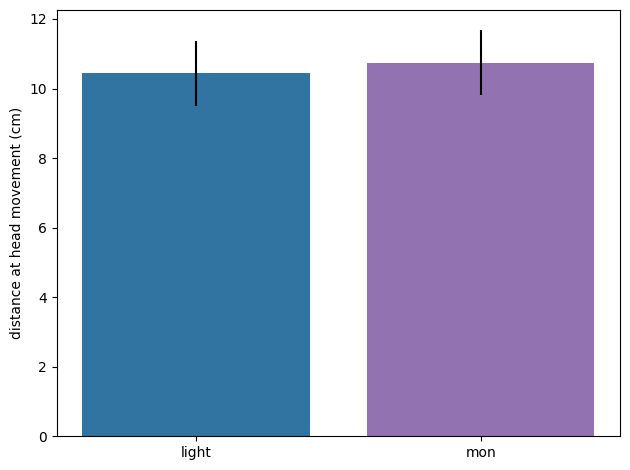

In [30]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([con,mon]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
#data = data[data.distance_at_head_turn_2<=10]
data = data[data.turn_to_obstacle == 'towards']

sns.barplot(ax = ax, data = data ,x='task_com' ,y = 'distance_at_head_turn_2',hue = 'task_com',estimator = 'mean',palette=['tab:blue','tab:purple'],ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('distance at head movement (cm)')
ax.set_xlabel('')
ax.set_xticks([0,1],['light','mon'])


light = data[data.task_com == 'oa']
light_mean = light.distance_at_head_turn_2.mean()
light_after= np.nanstd(light.groupby(['animal']).distance_at_head_turn_2.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).distance_at_head_turn_2.mean().to_numpy()))

dark = data[data.task_com == 'mon']
dark_mean = dark.distance_at_head_turn_2.mean()
dark_after= np.nanstd(dark.groupby(['animal']).distance_at_head_turn_2.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).distance_at_head_turn_2.mean().to_numpy()))

ax.errorbar([0,1],[light_mean,dark_mean] , yerr=[light_after,dark_after], ls='none' ,color="black")

<ErrorbarContainer object of 3 artists>

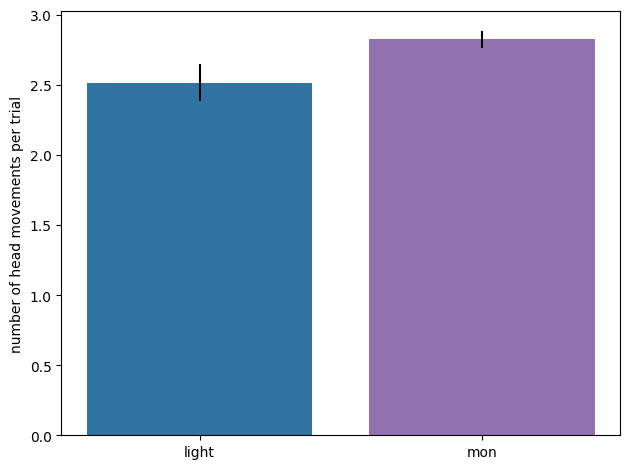

In [27]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([con,mon]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.num_turn<=10]
data = data[data.turn_to_obstacle == 'towards']

sns.barplot(ax = ax, data = data ,x='task_com' ,y = 'num_turn',hue = 'task_com',estimator = 'mean',palette=['tab:blue','tab:purple'],ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('number of head movements per trial')
ax.set_xlabel('')
ax.set_xticks([0,1],['light','mon'])


light = data[data.task_com == 'oa']
light_mean = light.num_turn.mean()
light_after= np.nanstd(light.groupby(['animal']).num_turn.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).num_turn.mean().to_numpy()))

dark = data[data.task_com == 'mon']
dark_mean = dark.num_turn.mean()
dark_after= np.nanstd(dark.groupby(['animal']).num_turn.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).num_turn.mean().to_numpy()))

ax.errorbar([0,1],[light_mean,dark_mean] , yerr=[light_after,dark_after], ls='none' ,color="black")

<ErrorbarContainer object of 3 artists>

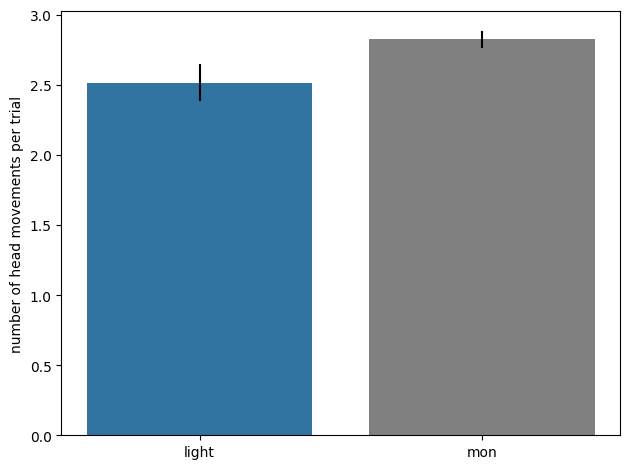

In [20]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light,mon]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.num_turn<=10]
data = data[data.turn_to_obstacle == 'towards']

sns.barplot(ax = ax, data = data ,x='task_com' ,y = 'num_turn',hue = 'task_com',estimator = 'mean',palette=['tab:blue','grey'],ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('number of head movements per trial')
ax.set_xlabel('')
ax.set_xticks([0,1],['light','mon'])


light = data[data.task_com == 'oa']
light_mean = light.num_turn.mean()
light_after= np.nanstd(light.groupby(['animal']).num_turn.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).num_turn.mean().to_numpy()))

dark = data[data.task_com == 'mon']
dark_mean = dark.num_turn.mean()
dark_after= np.nanstd(dark.groupby(['animal']).num_turn.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).num_turn.mean().to_numpy()))

ax.errorbar([0,1],[light_mean,dark_mean] , yerr=[light_after,dark_after], ls='none' ,color="black")


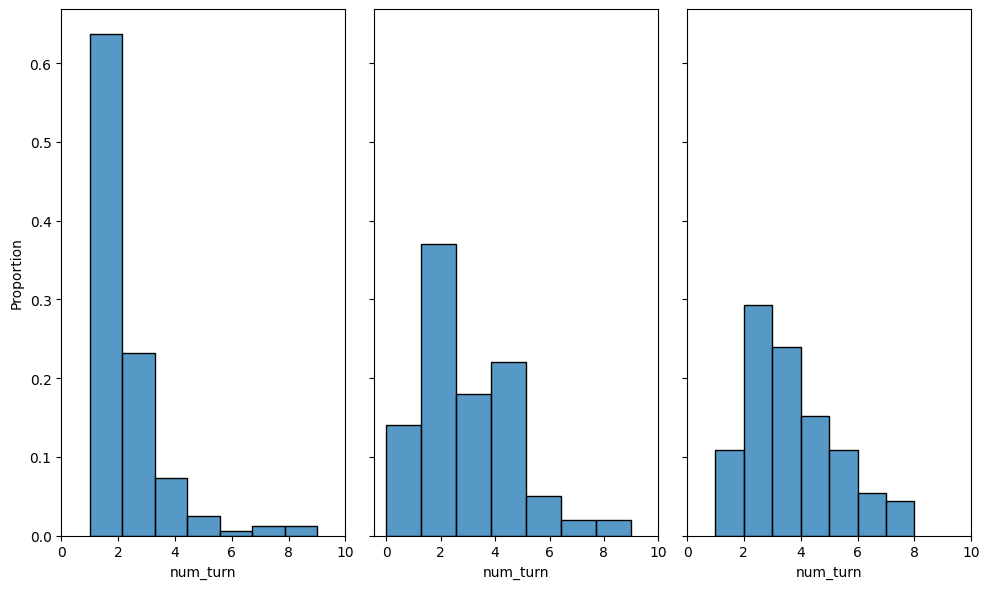

In [435]:
fig,ax = plt.subplots(1,3 ,layout = 'tight',figsize = (10,6),sharey=True)
data = pd.concat([light_long_nostart,mon_long_nostart,light_short_nostart,mon_long_nostart]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
data = data[data.time<=10]
data = data[data.num_turn<=10]

sns.histplot(ax = ax[0],data = data[data.task =='oa'],x = 'num_turn',bins = 7,stat='proportion')
sns.histplot(ax = ax[1],data = data[data.task =='oamonle'],x = 'num_turn',bins = 7,stat='proportion')
sns.histplot(ax = ax[2],data = data[data.task =='oamonre'],x = 'num_turn',bins = 7,stat='proportion')
ax[0].set_xticks([0,2,4,6,8,10])
ax[1].set_xticks([0,2,4,6,8,10])
ax[2].set_xticks([0,2,4,6,8,10])

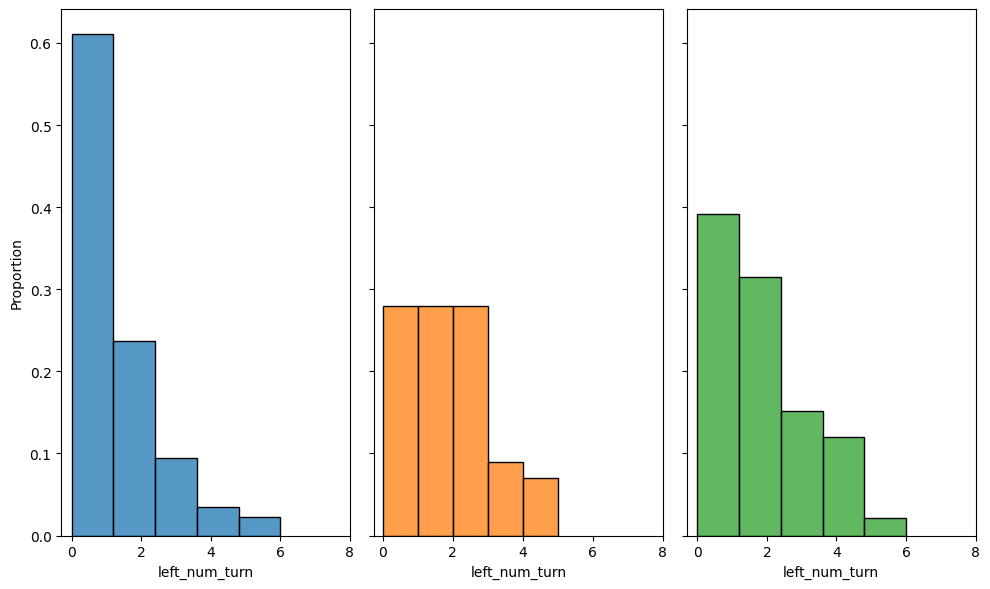

In [455]:
fig,ax = plt.subplots(1,3 ,layout = 'tight',figsize = (10,6),sharey=True)
data = pd.concat([light_long_nostart,mon_long_nostart,light_short_nostart,mon_long_nostart]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
data = data[data.time<=10]
data = data[data.left_num_turn<=6]

sns.histplot(ax = ax[0],data = data[data.task =='oa'],x = 'left_num_turn',bins = 5,stat='proportion')
sns.histplot(ax = ax[1],data = data[data.task =='oamonle'],x = 'left_num_turn',bins = 5,stat='proportion',color = 'tab:orange')
sns.histplot(ax = ax[2],data = data[data.task =='oamonre'],x = 'left_num_turn',bins = 5,stat='proportion',color = 'tab:green')
ax[0].set_xticks([0,2,4,6,8])
ax[1].set_xticks([0,2,4,6,8])
ax[2].set_xticks([0,2,4,6,8])

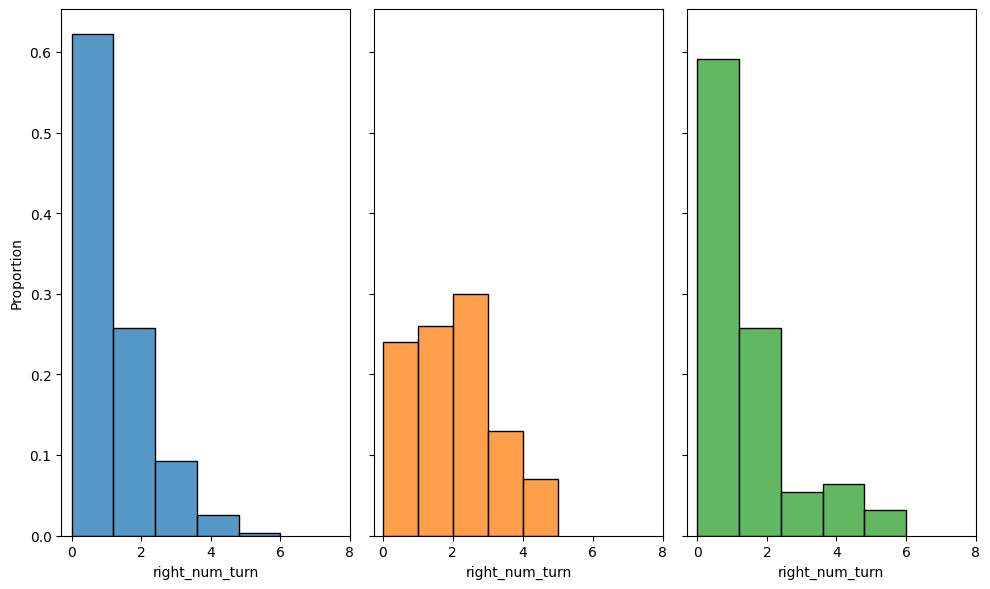

In [456]:
fig,ax = plt.subplots(1,3 ,layout = 'tight',figsize = (10,6),sharey=True)
data = pd.concat([light_long_nostart,mon_long_nostart,light_short_nostart,mon_long_nostart]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
data = data[data.time<=10]
data = data[data.right_num_turn<=6]

sns.histplot(ax = ax[0],data = data[data.task =='oa'],x = 'right_num_turn',bins = 5,stat='proportion')
sns.histplot(ax = ax[1],data = data[data.task =='oamonle'],x = 'right_num_turn',bins = 5,stat='proportion',color = 'tab:orange')
sns.histplot(ax = ax[2],data = data[data.task =='oamonre'],x = 'right_num_turn',bins = 5,stat='proportion',color = 'tab:green')
ax[0].set_xticks([0,2,4,6,8])
ax[1].set_xticks([0,2,4,6,8])
ax[2].set_xticks([0,2,4,6,8])

Text(0.5, 0, '')

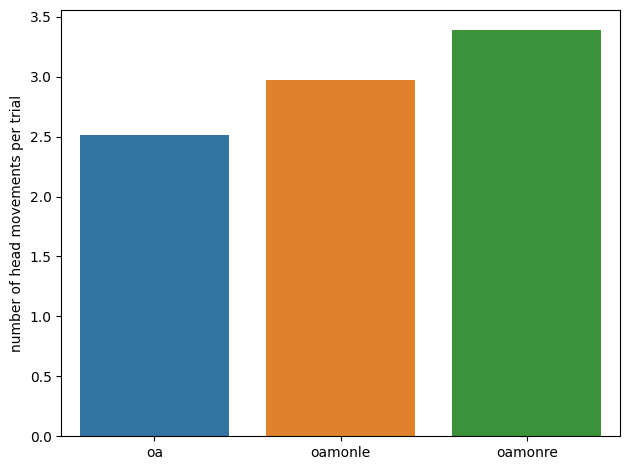

In [438]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light_long_nostart,mon_long_nostart,light_short_nostart,mon_long_nostart]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
data = data[data.time<=10]

sns.barplot(ax = ax, data = data ,x='task' ,y = 'num_turn',hue = 'task',estimator = 'mean',ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('number of head movements per trial')
ax.set_xlabel('')

Text(0.5, 0, '')

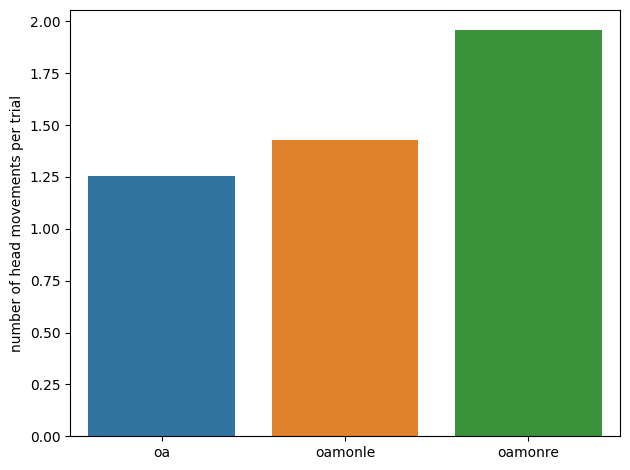

In [457]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light_long_nostart,mon_long_nostart,light_short_nostart,mon_long_nostart]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
data = data[data.time<=10]

sns.barplot(ax = ax, data = data ,x='task' ,y = 'left_num_turn',hue = 'task',estimator = 'mean',ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('number of head movements per trial')
ax.set_xlabel('')
#ax.set_xticks([0,1],['light','mon'])

Text(0.5, 0, '')

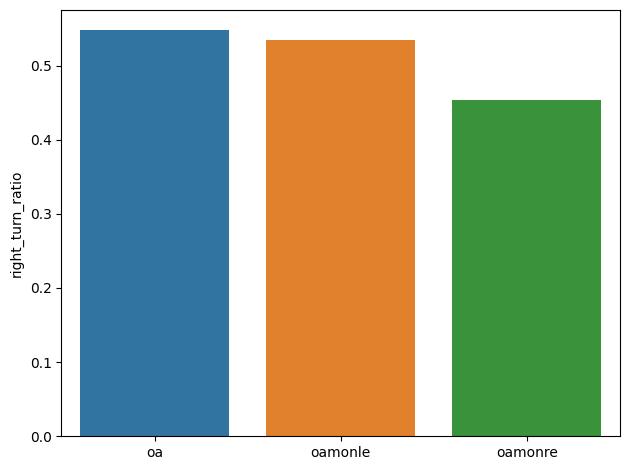

In [571]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light_long_nostart,mon_long_nostart,light_short_nostart,mon_long_nostart]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
data = data[data.time<=10]

sns.barplot(ax = ax, data = data ,x='task' ,y = 'right_turn_ratio',hue = 'task',estimator = 'mean',ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('right_turn_ratio')
ax.set_xlabel('')

Text(0.5, 0, '')

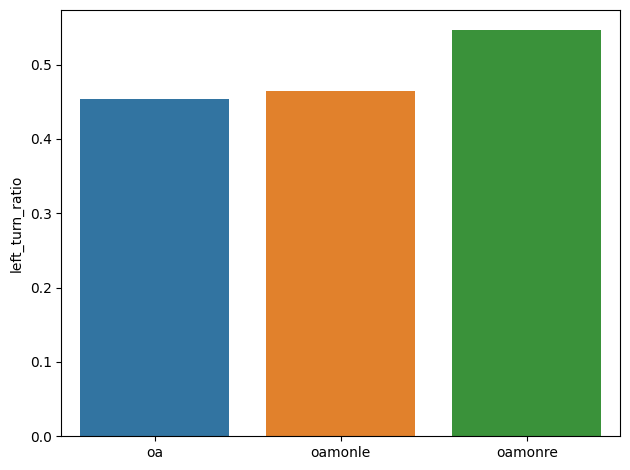

In [572]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light_long_nostart,mon_long_nostart,light_short_nostart,mon_long_nostart]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
data = data[data.time<=10]

sns.barplot(ax = ax, data = data ,x='task' ,y = 'left_turn_ratio',hue = 'task',estimator = 'mean',ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('left_turn_ratio')
ax.set_xlabel('')

Text(0.5, 0, '')

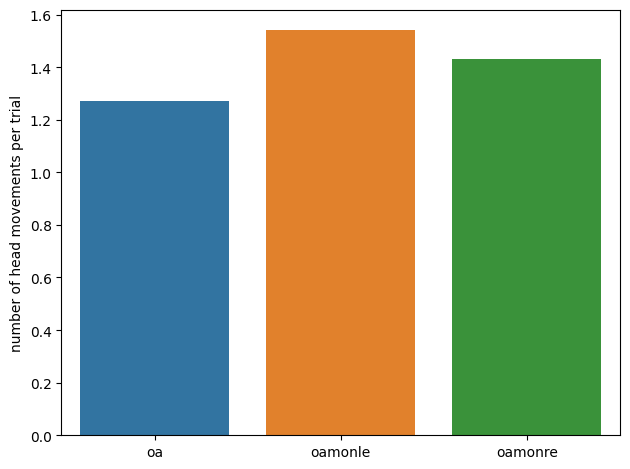

In [458]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light_long_nostart,mon_long_nostart,light_short_nostart,mon_long_nostart]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
data = data[data.time<=10]

sns.barplot(ax = ax, data = data ,x='task' ,y = 'right_num_turn',hue = 'task',estimator = 'mean',ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('number of head movements per trial')
ax.set_xlabel('')
#ax.set_xticks([0,1],['light','mon'])

Text(0.5, 0, '')

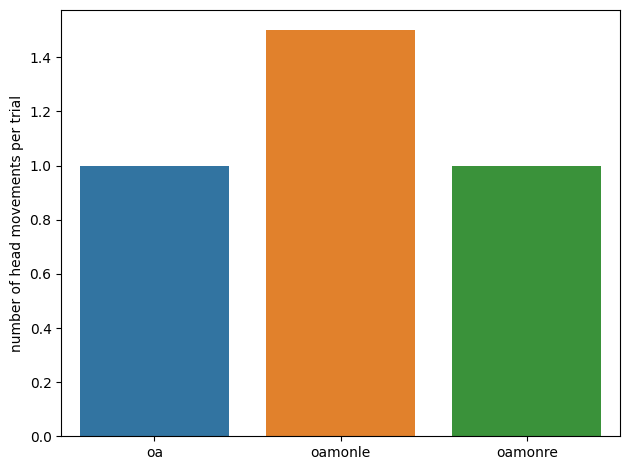

In [441]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light_long_nostart,mon_long_nostart,light_short_nostart,mon_long_nostart]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
data = data[data.time<=10]

sns.barplot(ax = ax, data = data ,x='task' ,y = 'right_num_turn',hue = 'task',estimator = 'median',ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('number of head movements per trial')
ax.set_xlabel('')
#ax.set_xticks([0,1],['light','mon'])


#light = data[data.task_com == 'oa']
#light_median = light.num_turn.median()
#light_after= np.nanstd(light.groupby(['animal']).num_turn.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).num_turn.mean().to_numpy()))
#
#dark = data[data.task_com == 'mon'] 
#dark_median = dark.num_turn.median()
#dark_after= np.nanstd(dark.groupby(['animal']).num_turn.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).num_turn.mean().to_numpy()))

#x.errorbar([0,1],[light_median,dark_median] , yerr=[light_after,dark_after], ls='none' ,color="black")

<ErrorbarContainer object of 3 artists>

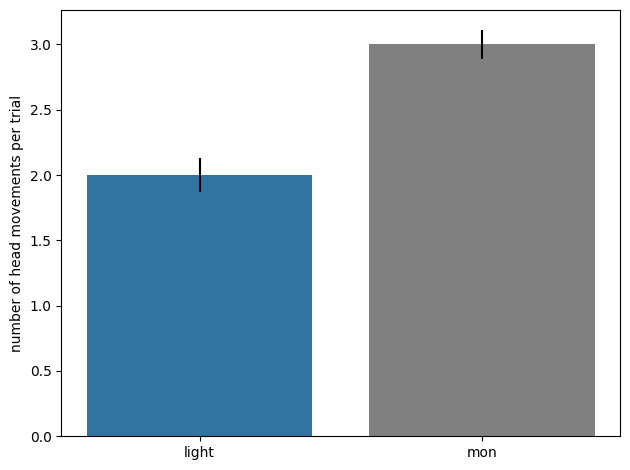

In [342]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light_long_nostart,mon_long_nostart,light_short_nostart,mon_long_nostart]) 
data = data.drop(columns=['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']
data = data[data.time<=10]

sns.barplot(ax = ax, data = data ,x='task_com' ,y = 'num_turn',hue = 'task_com',estimator = 'median',palette=['tab:blue','grey'],ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('number of head movements per trial')
ax.set_xlabel('')
ax.set_xticks([0,1],['light','mon'])


light = data[data.task == 'oa']
light_median = light.num_turn.median()
light_after= np.nanstd(light.groupby(['animal']).num_turn.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).num_turn.mean().to_numpy()))

dark = data[data.task_com == 'mon'] 
dark_median = dark.num_turn.median()
dark_after= np.nanstd(dark.groupby(['animal']).num_turn.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).num_turn.mean().to_numpy()))

ax.errorbar([0,1],[light_median,dark_median] , yerr=[light_after,dark_after], ls='none' ,color="black")



In [337]:
light_median

2.0

Text(0.5, 0.98, 'long')

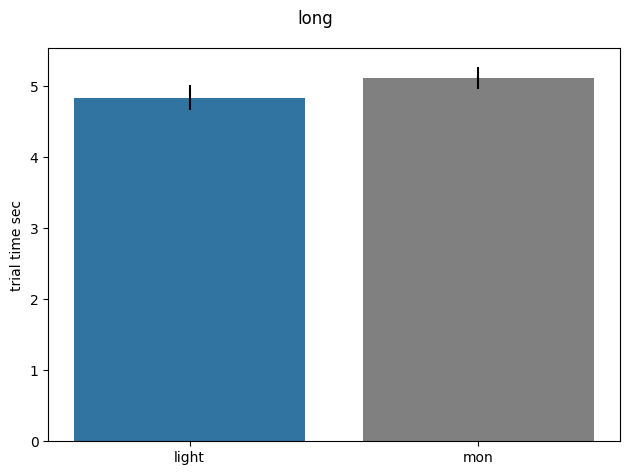

In [298]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light,mon]) 
#data = data[data.turn_to_obstacle == 'towards']

sns.barplot(ax = ax, data = data ,x='task' ,y = 'time',hue = 'task',estimator = 'mean',palette=['tab:blue','grey'],ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('trial time sec')
ax.set_xlabel('')
ax.set_xticks([0,1],['light','mon'])


light = data[data.task == 'oa']
light_mean = light.time.mean()
light_after= np.nanstd(light.groupby(['animal']).time.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).time.mean().to_numpy()))

dark = data[data.task == 'mon']
dark_mean = dark.time.mean()
dark_after= np.nanstd(dark.groupby(['animal']).time.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).time.mean().to_numpy()))

ax.errorbar([0,1],[light_mean,dark_mean] , yerr=[light_after,dark_after], ls='none' ,color="black")

fig.suptitle('long')

In [49]:
light.obstacle_cluster.unique()

array([5, 0, 1, 4, 2, 3])

Text(0.5, 0.98, 'long')

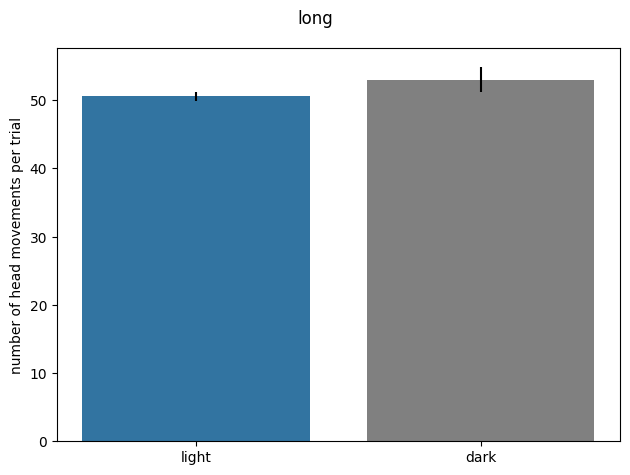

In [299]:
fig,ax = plt.subplots(layout = 'tight')
data = pd.concat([light_long_nostart,mon_long_nostart]) 
data = data.drop(columns = ['level_0'])
data = data.reset_index()
data = data[data.turn_to_obstacle == 'towards']

sns.barplot(ax = ax, data = data ,x='task' ,y = 'dist',hue = 'task',estimator = 'mean',palette=['tab:blue','grey'],ci=None) 
#ax.set_yticks([0,5,10])
ax.set_ylabel('number of head movements per trial')
ax.set_xlabel('')
ax.set_xticks([0,1],['light','dark'])


light = data[data.task == 'oa']
light_mean = light.dist.mean()
light_after= np.nanstd(light.groupby(['animal']).dist.mean().to_numpy())/np.sqrt(len(light.groupby(['animal']).dist.mean().to_numpy()))

dark = data[data.task == 'mon']
dark_mean = dark.dist.mean()
dark_after= np.nanstd(dark.groupby(['animal']).dist.mean().to_numpy())/np.sqrt(len(dark.groupby(['animal']).dist.mean().to_numpy()))

ax.errorbar([0,1],[light_mean,dark_mean] , yerr=[light_after,dark_after], ls='none' ,color="black")

fig.suptitle('long')

In [183]:
fake_time

array([[-4, -3, -2, -1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9]])

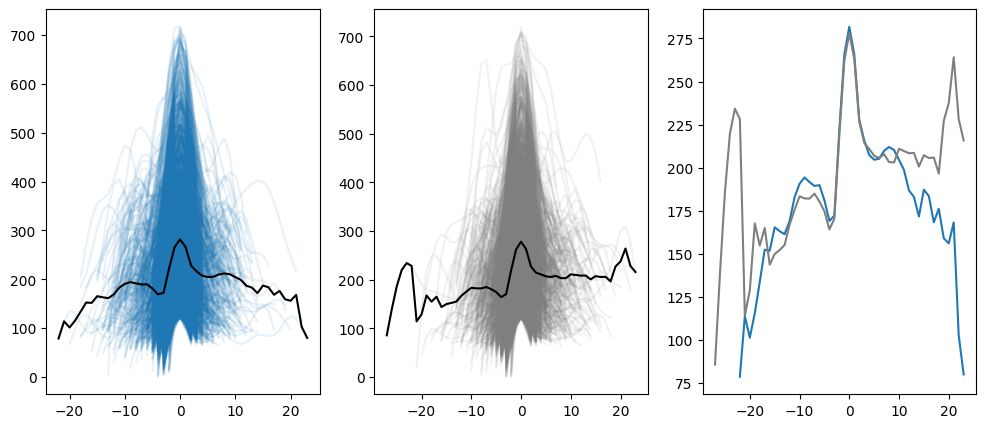

In [188]:
fig,ax = plt.subplots(1,3,figsize = (12,5))
head_turns =  []
resample_turns = []
fake_time_arr = []
xnew = np.arange(-30, 30, 1)

light = light
for ind,row in light.iterrows():
    peaks, prop = find_peaks(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]), width=1,height=(2,12),prominence=1)
    inds = np.vstack([prop['left_ips'].astype(int),prop['right_ips'].astype(int)]).T
    for i,v in enumerate(inds):
        turn = np.abs(row.head_angle_velocity[:int(row.obstacle_ind)])[inds[i][0]:inds[i][1]+1]
        if len(turn)<= 5:
                continue
        else:
            fake_time = create_monotonic_array(len(turn),np.argwhere(turn == prop['peak_heights'][i]))
            fake_time_arr.append(fake_time.tolist()[0])
            head_turns.append(turn)
head_turns = np.asarray(head_turns)
fake_time_arr = np.asarray(fake_time_arr)

for idx,turn in enumerate(head_turns):
    if len(turn)<= 5:
        continue
    else: 
        ax[0].plot(fake_time_arr[idx],turn*60,c = 'tab:blue',alpha = .1)

        interpolater = interp1d(fake_time_arr[idx],turn,bounds_error=False)
        ynew = interpolater(xnew)
        trace =ynew
        #trace = pd.Series(trace).interpolate(limit_direction ='backward')
        #trace = pd.Series(trace).interpolate(limit_direction ='forward')
            
        #trace = trace.to_numpy()
        resample_turns.append(trace)
resample_turns = np.asarray(resample_turns)


ax[0].plot(xnew,np.nanmean(resample_turns,axis=0)*60,c = 'black')
ax[2].plot(xnew,np.nanmean(resample_turns,axis=0)*60,c = 'tab:blue')

dark = mon
head_turns =  []
resample_turns = []
fake_time_arr = []
for ind,row in dark.iterrows():
    peaks, prop = find_peaks(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]), width=1,height=(2,12),prominence=1)
    inds = np.vstack([prop['left_ips'].astype(int),prop['right_ips'].astype(int)]).T
    for i,v in enumerate(inds):
        turn = np.abs(row.head_angle_velocity[:int(row.obstacle_ind)])[inds[i][0]:inds[i][1]+1]
        if len(turn)<= 5:
                continue
        else:
            fake_time = create_monotonic_array(len(turn),np.argwhere(turn == prop['peak_heights'][i]))
            fake_time_arr.append(fake_time.tolist()[0])
            head_turns.append(turn)
head_turns = np.asarray(head_turns)
fake_time_arr = np.asarray(fake_time_arr)

for idx,turn in enumerate(head_turns):
    if len(turn)<= 5:
        continue
    else: 
        ax[1].plot(fake_time_arr[idx],turn*60,c = 'tab:grey',alpha = .1)

        interpolater = interp1d(fake_time_arr[idx],turn,bounds_error=False)
        ynew = interpolater(xnew)
        trace =ynew
        #trace = pd.Series(trace).interpolate(limit_direction ='backward')
        #trace = pd.Series(trace).interpolate(limit_direction ='forward')
            
        #trace = trace.to_numpy()
        resample_turns.append(trace)
resample_turns = np.asarray(resample_turns)


ax[1].plot(xnew,np.nanmean(resample_turns,axis=0)*60,c = 'black')

ax[2].plot(xnew,np.nanmean(resample_turns,axis=0)*60,c = 'tab:grey')

In [191]:
np.nanmean(resample_turns,axis=0)

array([       nan,        nan,        nan, 1.42871495, 2.31050838,
       3.09926099, 3.66313345, 3.90457065, 3.8033689 , 1.90363899,
       2.14599859, 2.79446578, 2.58013853, 2.75032185, 2.39574158,
       2.49870397, 2.53670905, 2.58606907, 2.78216434, 2.92522663,
       3.05602301, 3.0360706 , 3.03409507, 3.08260255, 3.00574808,
       2.91141904, 2.73619682, 2.83870153, 3.64841106, 4.36399331,
       4.63380583, 4.38661748, 3.78172338, 3.57504207, 3.51499425,
       3.44858161, 3.42738086, 3.46367728, 3.38798096, 3.38330279,
       3.51619367, 3.4942452 , 3.47294471, 3.47630331, 3.34441035,
       3.45465755, 3.42593248, 3.4319669 , 3.27629408, 3.78640528,
       3.95792439, 4.40096639, 3.80377794, 3.59651067,        nan,
              nan,        nan,        nan,        nan,        nan])

In [189]:
xnew

array([-30, -29, -28, -27, -26, -25, -24, -23, -22, -21, -20, -19, -18,
       -17, -16, -15, -14, -13, -12, -11, -10,  -9,  -8,  -7,  -6,  -5,
        -4,  -3,  -2,  -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,
         9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,
        22,  23,  24,  25,  26,  27,  28,  29])

Text(0.5, 0, 'distance of headturn (cm)')

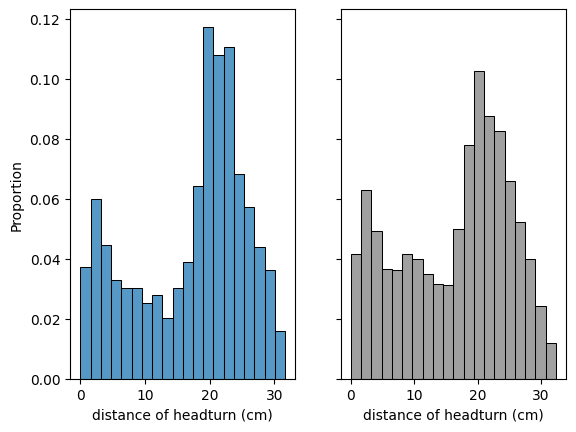

In [324]:
fig,ax = plt.subplots(1,2,sharey=True)
head_turn_distances =  []
light = long_nostart
for ind,row in light.iterrows():
    peaks, prop = find_peaks(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]), width=1,height=(2,12),prominence=1)
    inds = peaks
    for i,v in enumerate(inds):
        distance = row.ts_distance_from_edge[:int(row.obstacle_ind)][v]
        if distance >= 0: 
            head_turn_distances.append(distance)
        else:
            continue
#ax.hist(head_turn_distances,bins=20)
sns.histplot(ax= ax[0],data = head_turn_distances,bins=20,stat='proportion')

head_turn_distances =  []
dark = mon_long_nostart
for ind,row in dark.iterrows():
    peaks, prop = find_peaks(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]), width=1,height=(2,12),prominence=1)
    inds = peaks
    for i,v in enumerate(inds):
        distance = row.ts_distance_from_edge[:int(row.obstacle_ind)][v]
        if distance >= 0: 
            head_turn_distances.append(distance)
        else:
            continue
sns.histplot(ax= ax[1],data = head_turn_distances,bins=20,stat='proportion',color = 'grey')
ax[0].set_xlabel('distance of headturn (cm)')
ax[1].set_xlabel('distance of headturn (cm)')

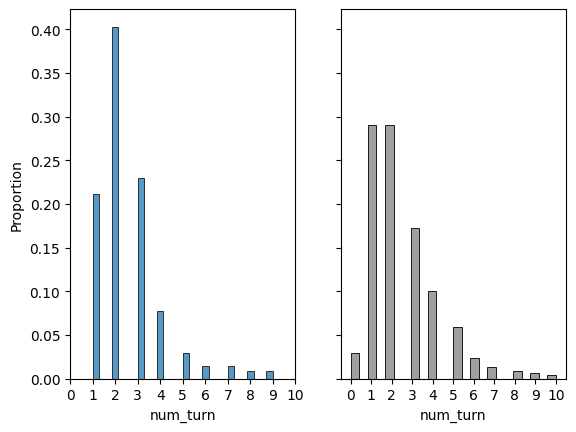

In [48]:
fig,ax  = plt.subplots(1,2,sharey=True)
light = light
dark = mon
sns.histplot (ax =ax[0], data = light[light.num_turn <= 10]  ,x = 'num_turn',stat='proportion') 
sns.histplot (ax =ax[1], data = dark[dark.num_turn <= 10]   ,x = 'num_turn',stat='proportion',color ='grey') 
ax[0].set_xticks([0,1,2,3,4,5,6,7,8,9,10])
ax[1].set_xticks([0,1,2,3,4,5,6,7,8,9,10])

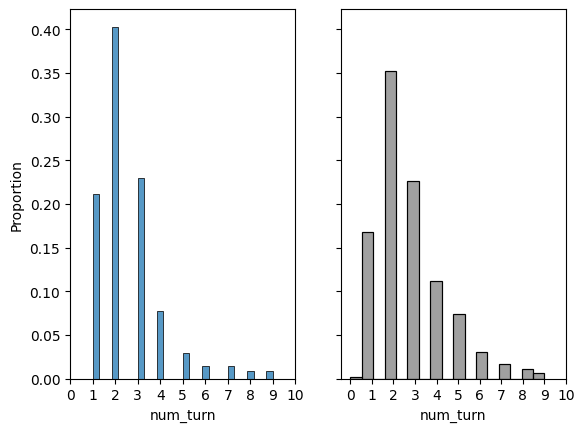

In [44]:
fig,ax  = plt.subplots(1,2,sharey=True)
light = light[light.turn_to_obstacle == 'towards']
dark = mon[mon.turn_to_obstacle == 'towards']
sns.histplot (ax =ax[0], data = light[light.num_turn <= 10]  ,x = 'num_turn',stat='proportion') 
sns.histplot (ax =ax[1], data = dark[dark.num_turn <= 10]   ,x = 'num_turn',stat='proportion',color ='grey') 
ax[0].set_xticks([0,1,2,3,4,5,6,7,8,9,10])
ax[1].set_xticks([0,1,2,3,4,5,6,7,8,9,10])

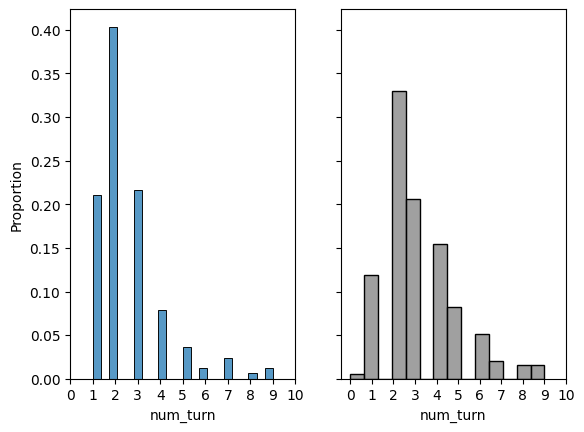

In [393]:
fig,ax  = plt.subplots(1,2,sharey=True)
light = light_long_nostart[light_long_nostart.turn_to_obstacle == 'towards']
dark = mon_long_nostart[mon_long_nostart.turn_to_obstacle == 'towards']
sns.histplot (ax =ax[0], data = light[light.num_turn <= 10]  ,x = 'num_turn',stat='proportion') 
sns.histplot (ax =ax[1], data = dark[dark.num_turn <= 10]   ,x = 'num_turn',stat='proportion',color ='grey') 
ax[0].set_xticks([0,1,2,3,4,5,6,7,8,9,10])
ax[1].set_xticks([0,1,2,3,4,5,6,7,8,9,10])

(0.0, 0.3)

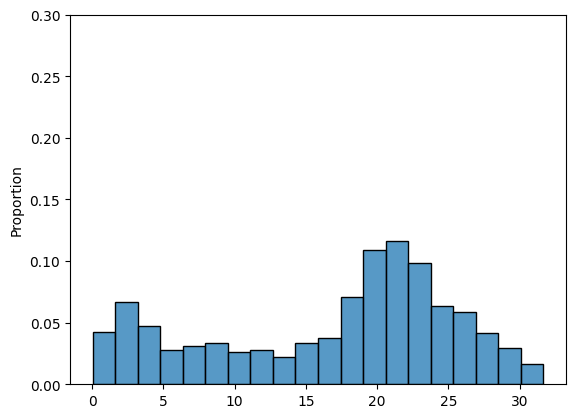

In [301]:
fig,ax = plt.subplots(1)
head_turn_distances =  []
test = mon_long_nostart
for ind,row in test.iterrows():
    peaks, prop = find_peaks(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]), width=1,height=(3,12),prominence=1)
    inds = peaks
    for i,v in enumerate(inds):
        distance = row.ts_distance_from_edge[:int(row.obstacle_ind)][v]
        if distance <=0:
            continue
        else:
            head_turn_distances.append(distance)
#ax.hist(head_turn_distances,bins=20)
sns.histplot(data = head_turn_distances,bins=20,stat='proportion')
plt.ylim(0,.3)

<AxesSubplot: ylabel='Proportion'>

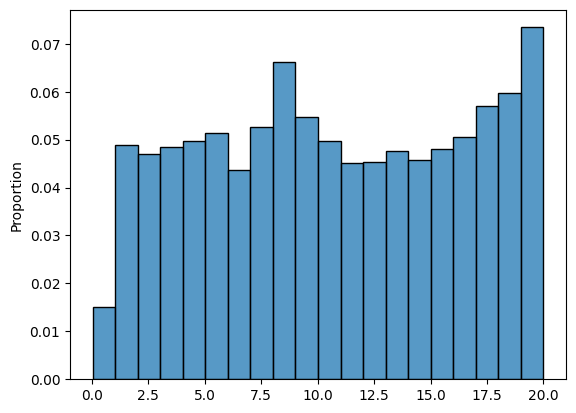

In [302]:

dist = flatten_list_of_arrays(light_long_nostart.ts_distance_from_edge.to_list())
dist = dist[np.where((dist>=0))]
dist = dist[np.where((dist<=20))]
sns.histplot(data = dist,stat='proportion',bins=20,color = 'tab:blue')

<AxesSubplot: ylabel='Proportion'>

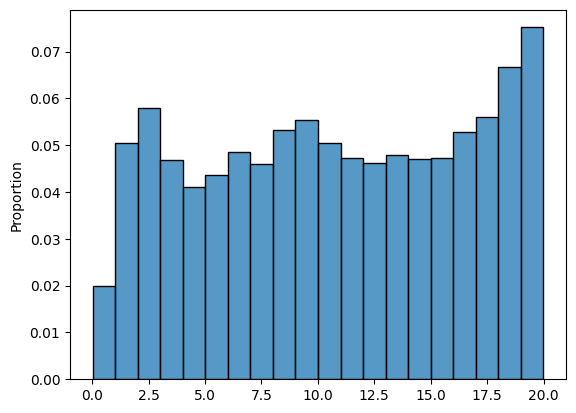

In [172]:

dist = flatten_list_of_arrays(mon_long_nostart.ts_distance_from_edge.to_list())
dist = dist[np.where((dist>=0))]
dist = dist[np.where((dist<=20))]
sns.histplot(data = dist,stat='proportion',bins=20,color = 'tab:blue')

In [76]:
peaks

array([29, 83], dtype=int64)

In [75]:
light_after

array([30, 84], dtype=int64)

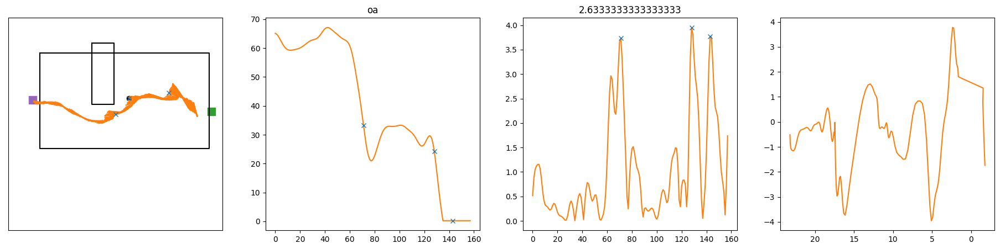

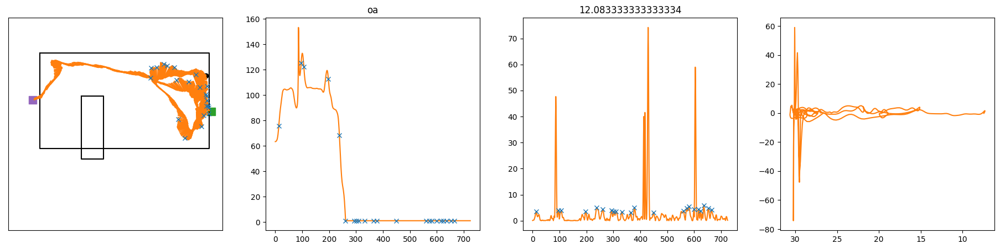

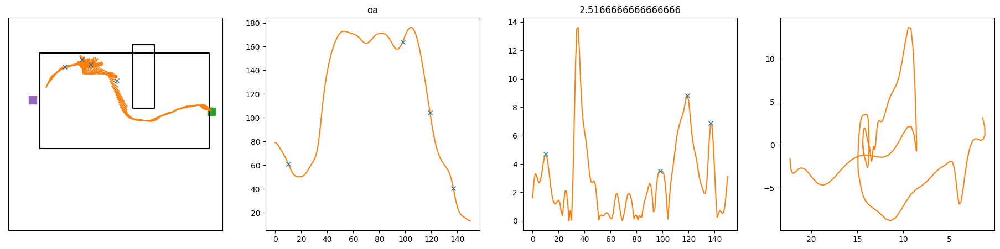

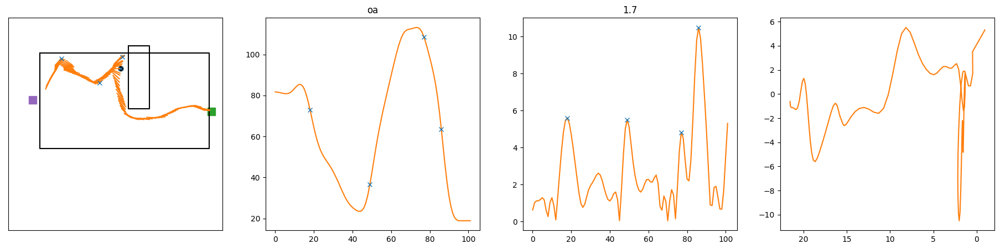

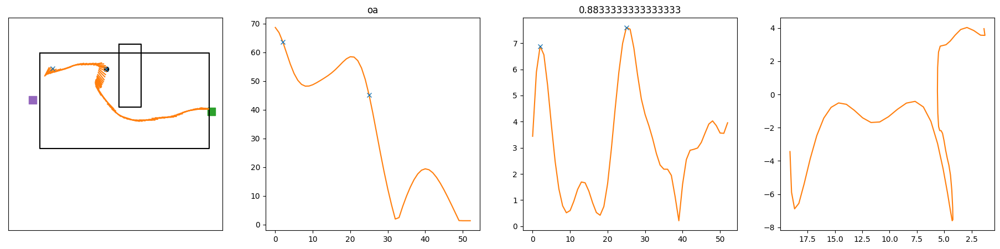

...

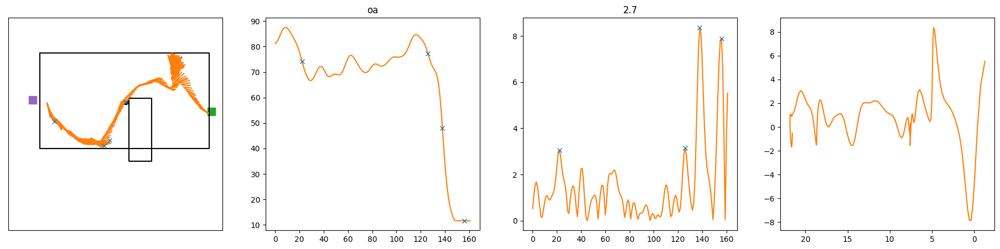

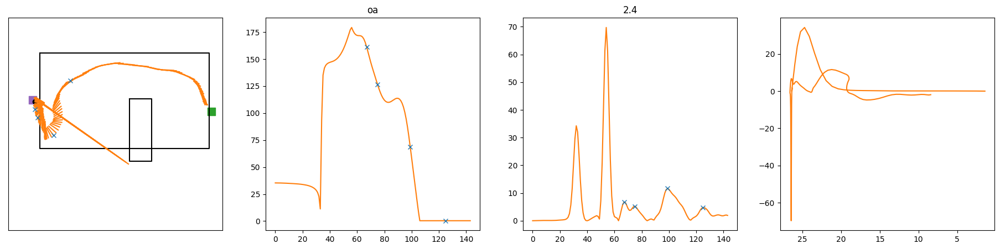

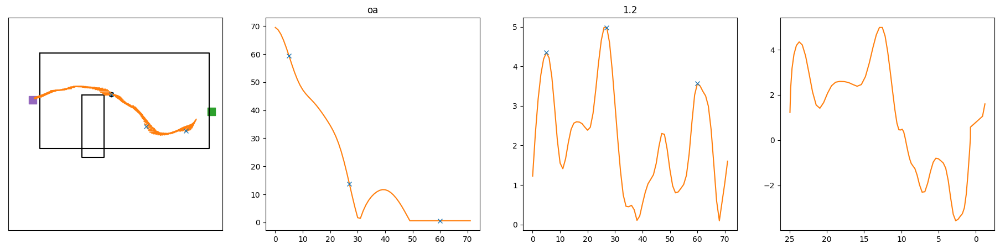

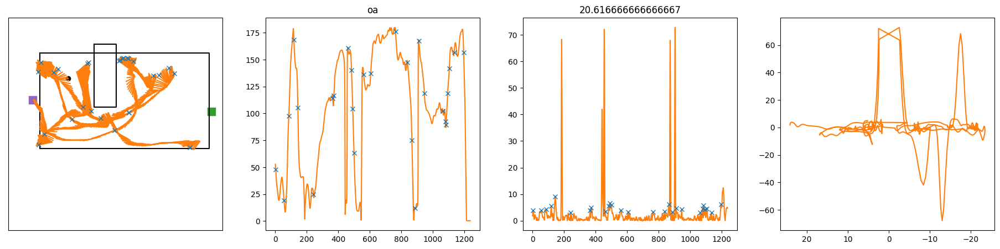

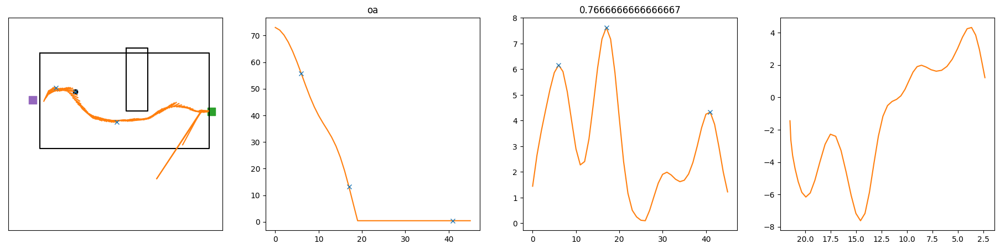

In [366]:
test = light_long_nostart[light_long_nostart.num_turn>=3].sample(50)
calculate_speed(test)

for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,4,figsize=(23,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[3].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title(str(row.task))
    ax[2].set_title(str(len(row.ts_nose_x_cm[:int(row.obstacle_ind)])/60))
   
    #ax[1].set_ylim(-12,2)

    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    #ax[1].plot(row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_velocity_at_turn_trace,color = 'tab:orange')
    ax[3].plot( row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_angle_velocity[:int(row.obstacle_ind)],color = 'tab:orange')
    thresh = row.head_angle_velocity[:int(row.obstacle_ind)].argmin()
    thresh_ind = np.argwhere(row.head_angle_velocity[:int(row.obstacle_ind)] == row.head_angle_velocity[:int(row.obstacle_ind)][thresh])[0][0]
    #ax[1].scatter(thresh_ind,row.head_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    #ax[2].scatter(row.ts_distance_from_edge[:int(row.obstacle_ind)][thresh],row.head_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[0].scatter(row.ts_nose_x_cm[:int(row.obstacle_ind)][thresh],row.ts_nose_y_cm[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[1].plot(row.ts_zero_out_angle_to_corner[:int(row.obstacle_ind)],color = 'tab:orange')
    ax[2].plot(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]),color = 'tab:orange')
    peaks, prop = find_peaks(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]), width=1,height=(3,12),prominence=1)
    ax[2].plot(peaks, np.abs(row.head_angle_velocity[:int(row.obstacle_ind)])[peaks], "x")
    ax[1].plot(peaks,row.ts_zero_out_angle_to_corner[:int(row.obstacle_ind)][peaks], "x")
    ax[0].plot(row.ts_nose_x_cm[peaks], row.ts_nose_y_cm[peaks],"x")

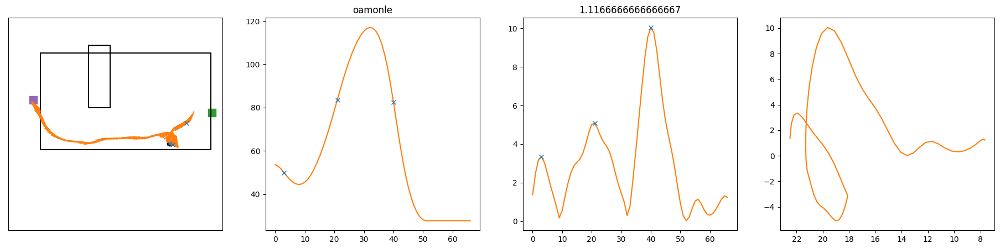

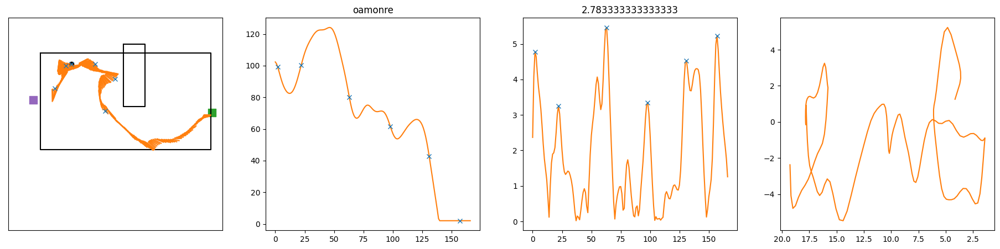

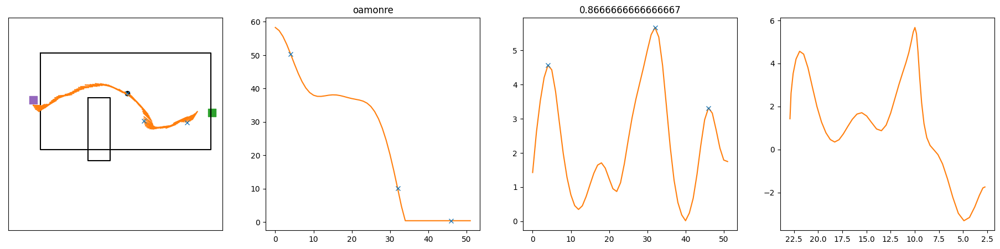

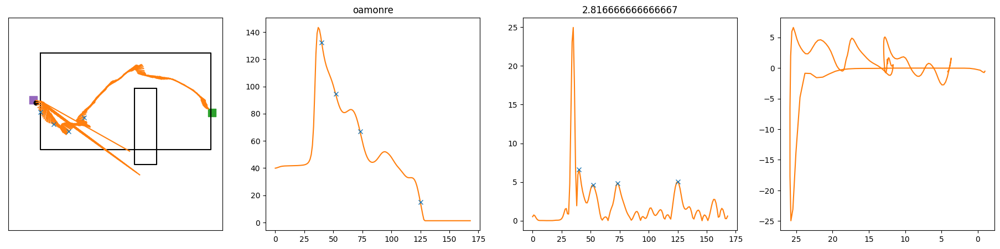

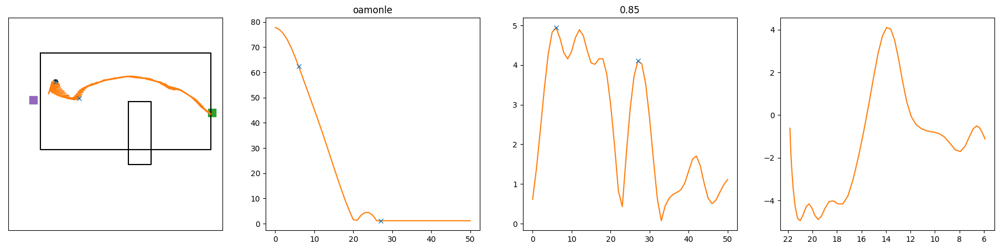

...

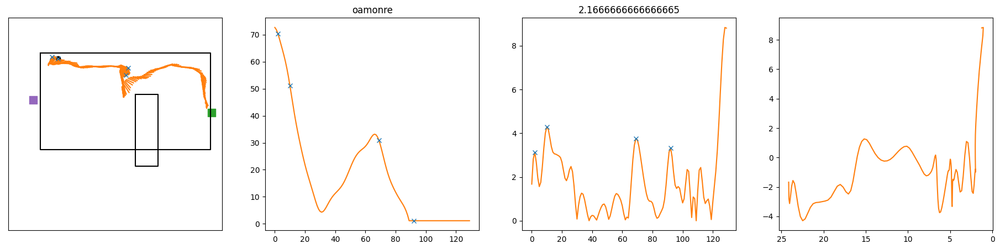

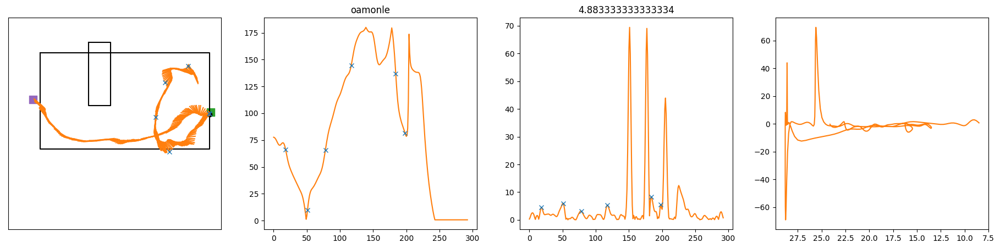

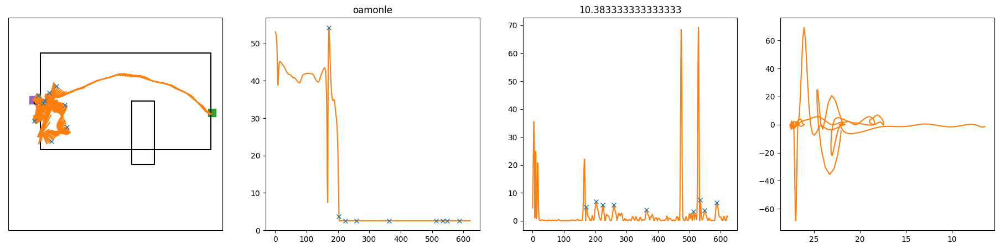

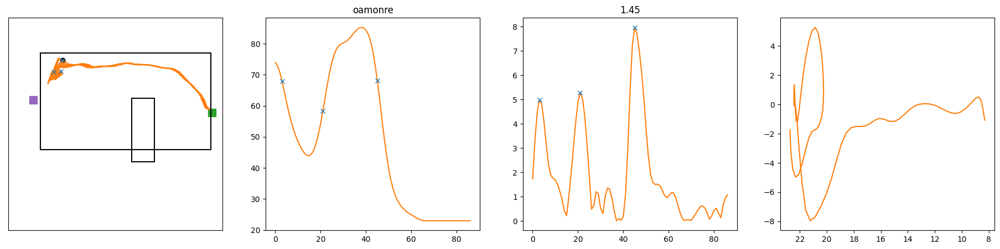

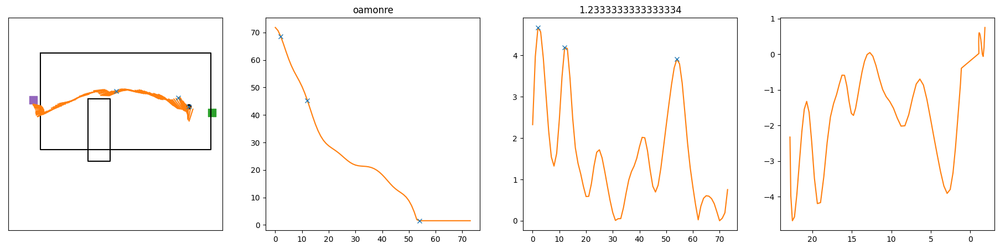

In [365]:
test = mon_long_nostart[mon_long_nostart.num_turn>=3].sample(50)
calculate_speed(test)

for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,4,figsize=(23,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    #ax[1].set_xlim(20,0)
    ax[3].invert_xaxis()
   # ax[2].set_xlim(20,0)
    if row.task == 'oadark':
        ax[0].set_facecolor('grey') 
        ax[0].patch.set_alpha(.4)
    else:
        None


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



    #ax[0].set_title()
   
    ax[1].set_title(str(row.task))
    ax[2].set_title(str(len(row.ts_nose_x_cm[:int(row.obstacle_ind)])/60))
   
    #ax[1].set_ylim(-12,2)

    

  
    ax[0].plot((row.ts_nose_x_cm,row.ts_spine_x_cm),(row.ts_nose_y_cm,row.ts_spine_y_cm),color = 'tab:orange')
    #ax[1].plot(row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_velocity_at_turn_trace,color = 'tab:orange')
    ax[3].plot( row.ts_distance_from_edge[:int(row.obstacle_ind)],row.head_angle_velocity[:int(row.obstacle_ind)],color = 'tab:orange')
    thresh = row.head_angle_velocity[:int(row.obstacle_ind)].argmin()
    thresh_ind = np.argwhere(row.head_angle_velocity[:int(row.obstacle_ind)] == row.head_angle_velocity[:int(row.obstacle_ind)][thresh])[0][0]
    #ax[1].scatter(thresh_ind,row.head_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    #ax[2].scatter(row.ts_distance_from_edge[:int(row.obstacle_ind)][thresh],row.head_angle_velocity[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[0].scatter(row.ts_nose_x_cm[:int(row.obstacle_ind)][thresh],row.ts_nose_y_cm[:int(row.obstacle_ind)][thresh],c = 'black')
    ax[1].plot(row.ts_zero_out_angle_to_corner[:int(row.obstacle_ind)],color = 'tab:orange')
    ax[2].plot(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]),color = 'tab:orange')
    peaks, prop = find_peaks(np.abs(row.head_angle_velocity[:int(row.obstacle_ind)]), width=1,height=(3,12),prominence=1)
    ax[2].plot(peaks, np.abs(row.head_angle_velocity[:int(row.obstacle_ind)])[peaks], "x")
    ax[1].plot(peaks,row.ts_zero_out_angle_to_corner[:int(row.obstacle_ind)][peaks], "x")
    ax[0].plot(row.ts_nose_x_cm[peaks], row.ts_nose_y_cm[peaks],"x")

In [42]:
calculate_speed(mon_long_nostart)

KeyError: 'ts_speed'

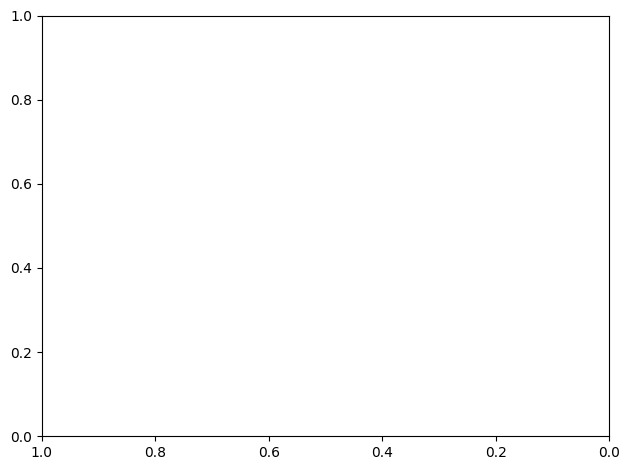

In [40]:
xnew =  np.arange(0, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(layout = 'tight')

ax.invert_xaxis()
data = pd.concat([light_long_nostart,mon_long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.turn_to_obstacle == 'towards']
#calculate_speed(data)
#ts_angle_to_open_corner(data)
#zero_out_angle(data)
light_medians = []
dark_medians = []
light_sd = []
dark_sd = []
for task,task_df in  data.groupby(['task_com']):
  
    rows = task_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(task_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            interpolater = interp1d(x,y,bounds_error=False)
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    
    task_angle_median= np.nanmedian(angle_array,axis = 0)

 
    if task == 'oa':
        light_array = angle_array
        light_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,task_angle_median,c = 'tab:blue',alpha = 1)
    else:
        dark_array = angle_array
        dark_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,dark_angle_median,c = 'black',alpha = 1)

    for animal,animal_df in task_df.groupby(['animal']):
        rows = animal_df.shape[0]
        angle_array = np.empty([rows,len(xnew)])
        angle_array[:] =np.nan 
        for i,row in enumerate(animal_df.iterrows()):
            x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
            y = row[1]['ts_speed'][:int(row[1]['obstacle_ind'])].astype(float)
            if sum(y) == 0:
                continue
            else:
                interpolater = interp1d(x,y,bounds_error=False)
                ynew = interpolater(xnew)
                angle_array[i] = ynew
        animal_angle_median= np.nanmedian(angle_array,axis = 0)
        if animal_df.task_com.unique() == 'oa':
            light_medians.append(animal_angle_median)
        else:
            dark_medians.append(animal_angle_median)

light_medians = np.asarray(light_medians)
dark_medians = np.asarray(dark_medians)

for i in list(range(light_medians.shape[1])):
    sd = np.nanstd(light_medians[:,i])/np.sqrt(len(light_medians))
    light_sd.append(sd)
light_sd = np.asarray(light_sd)

for i in list(range(dark_medians.shape[1])):
    sd = np.nanstd(dark_medians[:,i])/np.sqrt(len(dark_medians))
    dark_sd.append(sd)
dark_sd = np.asarray(dark_sd)

            






ax.fill_between(xnew, light_angle_median-light_sd, light_angle_median+light_sd, color='tab:blue', alpha=0.3, label='IQR')   
ax.fill_between(xnew, dark_angle_median-dark_sd, dark_angle_median+dark_sd, color='tab:grey', alpha=0.3, label='IQR')  
ax.set_xticks([10,5,0])    
ax.set_ylabel('heading to the opening (deg)')
ax.set_xlabel('distance to obstacle (cm)')
ax.axvline(0, color='r', ls=':')
ax.text(0, ax.get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90,fontsize=20)
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['light','mon'], numpoints=1,loc = 'lower left',fontsize=20)

In [1]:
xnew =  np.arange(0, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(layout = 'tight')

ax.invert_xaxis()
data = pd.concat([light_long_nostart,mon_long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.turn_to_obstacle == 'towards']
#ts_angle_to_open_corner(data)
#zero_out_angle(data)
light_medians = []
dark_medians = []
light_sd = []
dark_sd = []
for task,task_df in  data.groupby(['task_com']):
  
    rows = task_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(task_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['ts_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            interpolater = interp1d(x,y,bounds_error=False)
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    
    task_angle_median= np.nanmedian(angle_array,axis = 0)

 
    if task == 'oa':
        light_array = angle_array
        light_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,task_angle_median,c = 'tab:blue',alpha = 1)
    else:
        dark_array = angle_array
        dark_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,dark_angle_median,c = 'black',alpha = 1)

    for animal,animal_df in task_df.groupby(['animal']):
        rows = animal_df.shape[0]
        angle_array = np.empty([rows,len(xnew)])
        angle_array[:] =np.nan 
        for i,row in enumerate(animal_df.iterrows()):
            x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
            y = row[1]['ts_angle_to_corner'][:int(row[1]['obstacle_ind'])].astype(float)
            if sum(y) == 0:
                continue
            else:
                interpolater = interp1d(x,y,bounds_error=False)
                ynew = interpolater(xnew)
                angle_array[i] = ynew
        animal_angle_median= np.nanmedian(angle_array,axis = 0)
        if animal_df.task_com.unique() == 'oa':
            light_medians.append(animal_angle_median)
        else:
            dark_medians.append(animal_angle_median)

light_medians = np.asarray(light_medians)
dark_medians = np.asarray(dark_medians)

for i in list(range(light_medians.shape[1])):
    sd = np.nanstd(light_medians[:,i])/np.sqrt(len(light_medians))
    light_sd.append(sd)
light_sd = np.asarray(light_sd)

for i in list(range(dark_medians.shape[1])):
    sd = np.nanstd(dark_medians[:,i])/np.sqrt(len(dark_medians))
    dark_sd.append(sd)
dark_sd = np.asarray(dark_sd)

            






ax.fill_between(xnew, light_angle_median-light_sd, light_angle_median+light_sd, color='tab:blue', alpha=0.3, label='IQR')   
ax.fill_between(xnew, dark_angle_median-dark_sd, dark_angle_median+dark_sd, color='tab:grey', alpha=0.3, label='IQR')  
ax.set_xticks([10,5,0])    
ax.set_ylabel('heading to the opening (deg)')
ax.set_xlabel('distance to obstacle (cm)')
ax.axvline(0, color='r', ls=':')
ax.text(0, ax.get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90,fontsize=20)
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['light','mon'], numpoints=1,loc = 'lower left',fontsize=20)

NameError: name 'np' is not defined

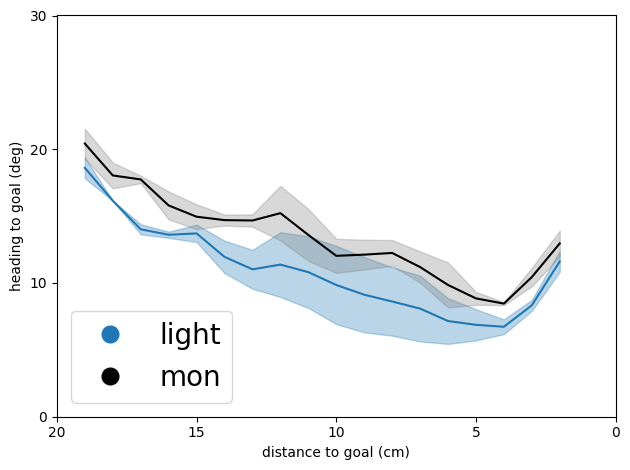

In [39]:
xnew =  np.arange(2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(layout = 'tight')
ax.invert_xaxis()
data = pd.concat([light_long_nostart,mon_long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.turn_to_obstacle == 'towards']
#ts_angle_to_open_corner(data)
#zero_out_angle(data)
light_medians = []
dark_medians = []
light_sd = []
dark_sd = []
for task,task_df in  data.groupby(['task_com']):
  
    rows = task_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(task_df.iterrows()):
        x = row[1]['ts_distance_from_target_port'][int(row[1]['obstacle_ind']):].astype(float)
        y = row[1]['ts_angle_to_target_port'][int(row[1]['obstacle_ind']):].astype(float)
        if sum(y) == 0:
            continue
        else:
            interpolater = interp1d(x,y,bounds_error=False)
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    
    task_angle_median= np.nanmedian(angle_array,axis = 0)

 
    if task == 'oa':
        light_array = angle_array
        light_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,task_angle_median,c = 'tab:blue',alpha = 1)
    else:
        dark_array = angle_array
        dark_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,dark_angle_median,c = 'black',alpha = 1)

    for animal,animal_df in task_df.groupby(['animal']):
        rows = animal_df.shape[0]
        angle_array = np.empty([rows,len(xnew)])
        angle_array[:] =np.nan 
        for i,row in enumerate(animal_df.iterrows()):
            x = row[1]['ts_distance_from_target_port'][int(row[1]['obstacle_ind']):].astype(float)
            y = row[1]['ts_angle_to_target_port'][int(row[1]['obstacle_ind']):].astype(float)
            if sum(y) == 0:
                continue
            else:
                interpolater = interp1d(x,y,bounds_error=False)
                ynew = interpolater(xnew)
                angle_array[i] = ynew
        animal_angle_median= np.nanmedian(angle_array,axis = 0)
        if animal_df.task_com.unique() == 'oa':
            light_medians.append(animal_angle_median)
        else:
            dark_medians.append(animal_angle_median)

light_medians = np.asarray(light_medians)
dark_medians = np.asarray(dark_medians)

for i in list(range(light_medians.shape[1])):
    sd = np.nanstd(light_medians[:,i])/np.sqrt(len(light_medians))
    light_sd.append(sd)
light_sd = np.asarray(light_sd)

for i in list(range(dark_medians.shape[1])):
    sd = np.nanstd(dark_medians[:,i])/np.sqrt(len(dark_medians))
    dark_sd.append(sd)
dark_sd = np.asarray(dark_sd)

            






ax.fill_between(xnew, light_angle_median-light_sd, light_angle_median+light_sd, color='tab:blue', alpha=0.3, label='IQR')   
ax.fill_between(xnew, dark_angle_median-dark_sd, dark_angle_median+dark_sd, color='tab:grey', alpha=0.3, label='IQR')  
ax.set_xticks([20,15,10,5,0]) 
ax.set_yticks([0,10,20,30])       
ax.set_ylabel('heading to goal (deg)')
ax.set_xlabel('distance to goal (cm)')
#ax.axvline(0, color='r', ls=':')
#ax.text(0, ax.get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90,fontsize=20)
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['light','mon'], numpoints=1,loc = 'lower left',fontsize=20)

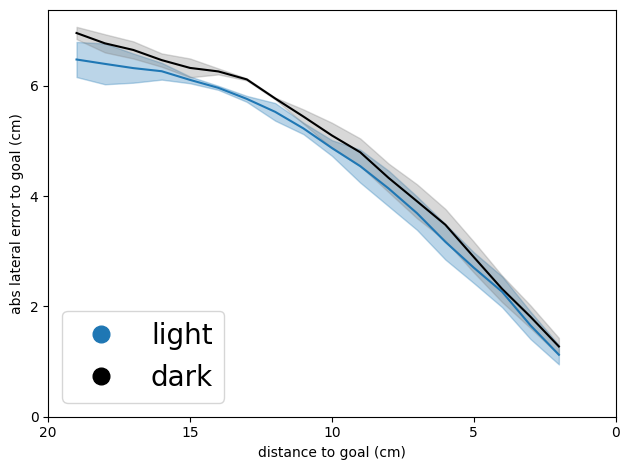

In [397]:
xnew =  np.arange(2, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(layout = 'tight')

ax.invert_xaxis()
data = pd.concat([light_long_nostart,mon_long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
#data = data[data.date_index == 3]
#ts_angle_to_open_corner(data)
#zero_out_angle(data)
light_medians = []
dark_medians = []
light_sd = []
dark_sd = []
for task,task_df in  data.groupby(['task_com']):
  
    rows = task_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(task_df.iterrows()):
        x = row[1]['ts_distance_from_target_port'][int(row[1]['obstacle_ind']):].astype(float)
        y = row[1]['ts_lateral_error_to_target_port'][int(row[1]['obstacle_ind']):].astype(float)
        if sum(y) == 0:
            continue
        else:
            interpolater = interp1d(x,y,bounds_error=False)
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    
    task_angle_median= np.nanmedian(angle_array,axis = 0)

 
    if task == 'oa':
        light_array = angle_array
        light_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,task_angle_median,c = 'tab:blue',alpha = 1)
    else:
        dark_array = angle_array
        dark_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,dark_angle_median,c = 'black',alpha = 1)

    for animal,animal_df in task_df.groupby(['animal']):
        rows = animal_df.shape[0]
        angle_array = np.empty([rows,len(xnew)])
        angle_array[:] =np.nan 
        for i,row in enumerate(animal_df.iterrows()):
            x = row[1]['ts_distance_from_target_port'][int(row[1]['obstacle_ind']):].astype(float)
            y = row[1]['ts_lateral_error_to_target_port'][int(row[1]['obstacle_ind']):].astype(float)
            if sum(y) == 0:
                continue
            else:
                interpolater = interp1d(x,y,bounds_error=False)
                ynew = interpolater(xnew)
                angle_array[i] = ynew
        animal_angle_median= np.nanmedian(angle_array,axis = 0)
        if animal_df.task_com.unique() == 'oa':
            light_medians.append(animal_angle_median)
        else:
            dark_medians.append(animal_angle_median)

light_medians = np.asarray(light_medians)
dark_medians = np.asarray(dark_medians)

for i in list(range(light_medians.shape[1])):
    sd = np.nanstd(light_medians[:,i])/np.sqrt(len(light_medians))
    light_sd.append(sd)
light_sd = np.asarray(light_sd)

for i in list(range(dark_medians.shape[1])):
    sd = np.nanstd(dark_medians[:,i])/np.sqrt(len(dark_medians))
    dark_sd.append(sd)
dark_sd = np.asarray(dark_sd)

            






ax.fill_between(xnew, light_angle_median-light_sd, light_angle_median+light_sd, color='tab:blue', alpha=0.3, label='IQR')   
ax.fill_between(xnew, dark_angle_median-dark_sd, dark_angle_median+dark_sd, color='tab:grey', alpha=0.3, label='IQR')  
ax.set_xticks([20,15,10,5,0])    
ax.set_yticks([0,2,4,6])    
ax.set_ylabel('abs lateral error to goal (cm)')
ax.set_xlabel('distance to goal (cm)')

   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['light','dark'], numpoints=1,loc = 'lower left',fontsize=20)

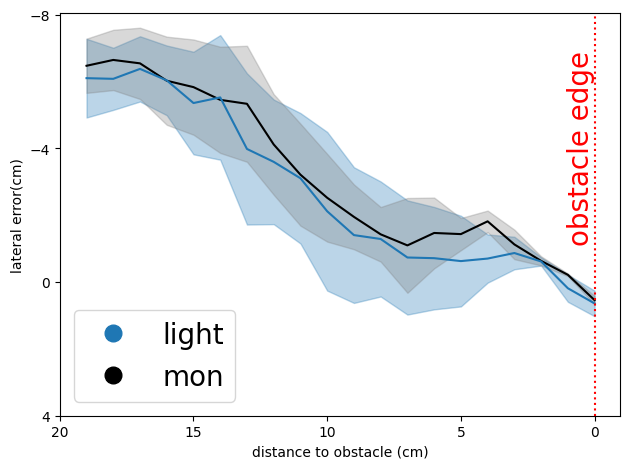

In [43]:
xnew =  np.arange(0, 20, 1)
xnew= np.flip(xnew)
fig,ax = plt.subplots(layout = 'tight')

ax.invert_xaxis()
ax.invert_yaxis()
data = pd.concat([light_long_nostart,mon_long_nostart])
data = drop_nans_in_columns(data,'obstacle_ind')
data = data[data.turn_to_obstacle == 'towards']
#ts_angle_to_open_corner(data)
#zero_out_angle(data)
light_medians = []
dark_medians = []
light_sd = []
dark_sd = []
for task,task_df in  data.groupby(['task_com']):
  
    rows = task_df.shape[0]
    angle_array = np.empty([rows,len(xnew)])
    angle_array[:] =np.nan 
    for i,row in enumerate(task_df.iterrows()):
        x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
        y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
        if sum(y) == 0:
            continue
        else:
            interpolater = interp1d(x,y,bounds_error=False)
            ynew = interpolater(xnew)
            angle_array[i] = ynew

    
    task_angle_median= np.nanmedian(angle_array,axis = 0)

 
    if task == 'oa':
        light_array = angle_array
        light_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,task_angle_median,c = 'tab:blue',alpha = 1)
    else:
        dark_array = angle_array
        dark_angle_median= np.nanmedian(angle_array,axis = 0)
        ax.plot(xnew,dark_angle_median,c = 'black',alpha = 1)

    for animal,animal_df in task_df.groupby(['animal']):
        rows = animal_df.shape[0]
        angle_array = np.empty([rows,len(xnew)])
        angle_array[:] =np.nan 
        for i,row in enumerate(animal_df.iterrows()):
            x = row[1]['ts_distance_from_edge'][:int(row[1]['obstacle_ind'])].astype(float)
            y = row[1]['lateral_error'][:int(row[1]['obstacle_ind'])].astype(float)
            if sum(y) == 0:
                continue
            else:
                interpolater = interp1d(x,y,bounds_error=False)
                ynew = interpolater(xnew)
                angle_array[i] = ynew
        animal_angle_median= np.nanmedian(angle_array,axis = 0)
        if animal_df.task_com.unique() == 'oa':
            light_medians.append(animal_angle_median)
        else:
            dark_medians.append(animal_angle_median)

light_medians = np.asarray(light_medians)
dark_medians = np.asarray(dark_medians)

for i in list(range(light_medians.shape[1])):
    sd = np.nanstd(light_medians[:,i])/np.sqrt(len(light_medians))
    light_sd.append(sd)
light_sd = np.asarray(light_sd)

for i in list(range(dark_medians.shape[1])):
    sd = np.nanstd(dark_medians[:,i])/np.sqrt(len(dark_medians))
    dark_sd.append(sd)
dark_sd = np.asarray(dark_sd)

            






ax.fill_between(xnew, light_angle_median-light_sd, light_angle_median+light_sd, color='tab:blue', alpha=0.3, label='IQR')   
ax.fill_between(xnew, dark_angle_median-dark_sd, dark_angle_median+dark_sd, color='tab:grey', alpha=0.3, label='IQR')  
ax.set_xticks([20,15,10,5,0])    
ax.set_yticks([-8,-4,0,4]) 
ax.set_ylabel('lateral error(cm)')
ax.set_xlabel('distance to obstacle (cm)')
ax.axvline(0, color='r', ls=':')
ax.text(0, ax.get_ylim()[1]/2,'obstacle edge', color='r', ha='right', va='center', rotation=90,fontsize=20)
   
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='',markersize=12) for color in ['tab:blue','black']]
ax.legend(markers, ['light','mon'], numpoints=1,loc = 'lower left',fontsize=20)

In [12]:
head_body_angle_arr

array([[90.46160313, 90.42776327, 90.38032887, ..., 89.80398861,
        89.82581891, 89.85316774],
       [90.53694385, 90.50174825, 90.45343894, ..., 89.89350893,
        89.91417565, 89.94024497],
       [90.60795419, 90.57272276, 90.52395638, ..., 89.94774831,
        89.9692465 , 89.99628678],
       ...,
       [90.27421422, 90.28193939, 90.28088568, ..., 89.95478309,
        89.97341399, 89.99468984],
       [90.28288649, 90.28160841, 90.26884864, ..., 89.8246157 ,
        89.84723811, 89.87367331],
       [90.26679699, 90.26393416, 90.24918929, ..., 89.78706649,
        89.8102417 , 89.83741051]])

In [14]:
deg

array([90.26679699, 90.26393416, 90.24918929, 90.20938414, 90.17851671,
       90.14619592, 90.1289979 , 90.09790067, 90.05925855, 90.03552933,
       90.01543067, 89.99656439, 90.00148686, 90.00745109, 90.03828966,
       90.06086323, 90.06719724, 90.08253664, 90.1133032 , 90.13969004,
       90.1728104 , 90.21170559, 90.25617626, 90.30269378, 90.36767849,
       90.42786059, 90.47253496, 90.51627418, 90.57260294, 90.63528144,
       90.69968494, 90.78598913, 90.84837096, 90.92132726, 90.98754107,
       91.06210543, 91.13184967, 91.20772773, 91.27560812, 91.34392114,
       91.40878661, 91.47135899, 91.52557306, 91.57292057, 91.61145199,
       91.65441982, 91.68379681, 91.71739593, 91.74754326, 91.78447839,
       91.80898893, 91.82855192, 91.85358344, 91.87810932, 91.88306261,
       91.87982587, 91.87214323, 91.85523627, 91.8532595 , 91.84978426,
       91.85464482, 91.86388691, 91.87092908, 91.88397752, 91.89838301,
       91.90320633, 91.90860639, 91.91099892, 91.91389811, 91.91

In [18]:
head_body_angle_arr

array([168.91354218, 173.32315282, 172.32351506, 177.29082233,
       176.17641852, 171.68832064, 170.89195067, 172.66906408,
       177.9338079 , 174.97208497, 174.28089532, 179.93407461,
       178.3963965 , 178.01163784, 179.04184138, 177.16496205,
       179.85196822, 179.01069106, 179.46406562, 178.42779081,
       175.62485357, 179.05680126, 173.66509386, 161.62413318,
       165.39237313, 169.03343889, 163.26415322, 159.42380509,
       163.16072042, 166.39889987, 160.05101117, 161.69332776,
       158.4226683 , 156.65499678, 153.66220788, 150.73011373,
       151.51926469, 155.87460188, 156.81964736, 161.95667917,
       158.74574208, 162.2115407 , 163.43799959, 158.75089816,
       167.605553  , 172.0413632 , 176.67506148, 178.58332173,
       173.01475473, 152.98387251, 163.46820214, 163.12098383,
       161.38635176, 158.49671346, 158.74465832, 165.30322891,
       167.2498604 , 168.51639457, 173.30636395, 177.27096985,
       178.43216573, 179.09435127, 174.90193987, 168.44

In [16]:
deg

array([90.26679699, 90.26393416, 90.24918929, 90.20938414, 90.17851671,
       90.14619592, 90.1289979 , 90.09790067, 90.05925855, 90.03552933,
       90.01543067, 89.99656439, 90.00148686, 90.00745109, 90.03828966,
       90.06086323, 90.06719724, 90.08253664, 90.1133032 , 90.13969004,
       90.1728104 , 90.21170559, 90.25617626, 90.30269378, 90.36767849,
       90.42786059, 90.47253496, 90.51627418, 90.57260294, 90.63528144,
       90.69968494, 90.78598913, 90.84837096, 90.92132726, 90.98754107,
       91.06210543, 91.13184967, 91.20772773, 91.27560812, 91.34392114,
       91.40878661, 91.47135899, 91.52557306, 91.57292057, 91.61145199,
       91.65441982, 91.68379681, 91.71739593, 91.74754326, 91.78447839,
       91.80898893, 91.82855192, 91.85358344, 91.87810932, 91.88306261,
       91.87982587, 91.87214323, 91.85523627, 91.8532595 , 91.84978426,
       91.85464482, 91.86388691, 91.87092908, 91.88397752, 91.89838301,
       91.90320633, 91.90860639, 91.91099892, 91.91389811, 91.91

In [21]:
test.loc[0]

,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,rightear_x,...,std_interp_ts_nose_y_cm,mad_interp_ts_nose_y_cm,animal_mean_interp_ts_nose_y_cm,animal_median_interp_ts_nose_y_cm,animal_std_interp_ts_nose_y_cm,animal_mad_interp_ts_nose_y_cm,date_mean_interp_ts_nose_y_cm,date_median_interp_ts_nose_y_cm,date_std_interp_ts_nose_y_cm,date_mad_interp_ts_nose_y_cm
0,0.0,48456.015206,48460.803673,"[48456.027724, 48456.045324, 48456.061158, 484...","[74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 8...","[563.0762329101562, 556.8819580078125, 552.149...","[200.8858642578125, 195.24050903320312, 189.17...","[570.1536865234375, 566.5206298828125, 562.435...","[226.8381805419922, 221.6623992919922, 216.326...","[583.129638671875, 578.699951171875, 573.09875...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,45275.144857,45281.649830,"[45275.15808, 45275.174937, 45275.19159, 45275...","[75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 8...","[75.5582275390625, 75.72111511230469, 75.13881...","[229.93434143066406, 229.31825256347656, 229.7...","[81.82502746582031, 82.03642272949219, 81.6359...","[249.5370330810547, 249.50537109375, 249.60067...","[93.58667755126953, 93.90813446044922, 93.1349...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
for ind,row in test.iterrows():
    head_body_angle_arr = []
    nose_x = row['ts_nose_x_cm'].astype(float)
    nose_y = row['ts_nose_y_cm'].astype(float)
    ear_x = np.mean([row['ts_rightear_x_cm'],row['ts_leftear_x_cm']],axis=0)
    ear_y = np.mean([row['ts_rightear_y_cm'],row['ts_leftear_y_cm']],axis=0)
    spine_x, spine_y = row.ts_spine_x_cm.astype(float),row.ts_spine_y_cm.astype(float)
    tailbase_x, tailbase_y = row.ts_tailbase_x_cm.astype(float),row.ts_tailbase_y_cm.astype(float)
    for i in list(range(len(nose_x))):
        vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
        vector2 = calculate_vector_between_points((spine_x[i],spine_y[i]),(tailbase_x[i],tailbase_y[i]))# vector from nose to open corner
        rad,deg = angle_between_vectors(vector1,vector2)
        head_body_angle_arr.append(deg)
    head_body_angle_arr = np.array(head_body_angle_arr)
    test.at[ind,'head_body_angle'] = head_body_angle_arr.astype(object)

ValueError: NumPy boolean array indexing assignment cannot assign 287 input values to the 2 output values where the mask is true

In [ ]:
 np.degrees(angle_radians)

In [232]:
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return  np.degrees(np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)))

In [207]:
elif row.odd == 'right':
            df.at[ind,'right_num_turn'] = len(neg_peaks)
            df.at[ind,'left_num_turn'] = len(pos_peaks)
        elif row.odd == 'left':
            df.at[ind,'right_num_turn'] = len(pos_peaks)
            df.at[ind,'left_num_turn'] = len(neg_peaks)

NameError: name 'calculate_angular_velocity' is not defined

In [284]:
def head_body_angle(df):
    for ind,row in df.iterrows():
        head_body_angle_arr = []
        nose_x = row['ts_nose_x_cm'].astype(float)
        nose_y = row['ts_nose_y_cm'].astype(float)
        ear_x = np.mean([row['ts_rightear_x_cm'],row['ts_leftear_x_cm']],axis=0)
        ear_y = np.mean([row['ts_rightear_y_cm'],row['ts_leftear_y_cm']],axis=0)
        spine_x, spine_y = row.ts_spine_x_cm.astype(float),row.ts_spine_y_cm.astype(float)
        tailbase_x, tailbase_y = row.ts_tailbase_x_cm.astype(float),row.ts_tailbase_y_cm.astype(float)
        for i in list(range(len(nose_x))):
            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
            vector2 = calculate_vector_between_points((tailbase_x[i],tailbase_x[i]),(spine_x[i],spine_y[i]))# vector from nose to open corner
            #vector2 = calculate_vector_between_points((spine_x[i],spine_y[i]),(tailbase_x[i],tailbase_y[i]))# vector from nose to open corner
            deg = angle_between(vector1,vector2)
            deg = deg * (row.head_angle[i]/np.abs(row.head_angle[i]))
            head_body_angle_arr.append(deg)
        head_body_angle_arr = np.array(head_body_angle_arr)
        df.at[ind,'head_body_angle'] = head_body_angle_arr.astype(object)
        #df.at[ind,'head_body_angle_velocity'] = smooth(calculate_angular_velocity(head_body_angle_arr,60)).astype(object)

In [285]:

head_body_angle(mon)
head_body_angle(light)
light_long_nostart,light_short_nostart,light_middle_nostart = create_df_by_type_nostart(light)
mon_long_nostart,mon_short_nostart,mon_middle_nostart = create_df_by_type_nostart(mon)

In [370]:
len(neg_peaks)

2

In [368]:
neg_peaks, neg_prop = find_peaks((row.head_corner_angle_velocity[:int(row.obstacle_ind)]*-1), width=2,height=(3,12))

In [26]:
con.date.unique()

array(['021624', '021824', '022024', '021924'], dtype=object)

In [44]:
test.loc[test.num_turn<=10].num_turn.mean()

2.576923076923077

In [45]:
test1 = con[(con.animal == 'J675NN') & (con.date == '022024')]
test1.loc[test1.num_turn<=10].num_turn.mean()

2.0634920634920637

In [70]:
row.head_angle_velocity

array([17.566970542344848, 24.98807462718605, 20.898398811463803,
       10.649571377754423, -1.860657961828629, -17.181528930368152,
       -35.52866614757479, -51.40454552236939, -55.935544513491486,
       -45.83232583674453, -27.714812542021612, -11.706266290698949,
       -2.815554799177842, 0.2581236379136387, 0.8640671822487089,
       1.2270904202447763, 2.0886007089319003, 3.329539877897947,
       4.459852990504785, 5.094912376290437, 5.250180303309011,
       5.268771903950564, 5.539071515371661, 6.505679239316682,
       8.963668761301463, 13.807853325865484, 20.716933384733355,
       27.026476392782687, 28.97913289895474, 24.975098160066995,
       17.171237167386376, 9.403771201690532, 4.095519538332257,
       1.3941100081435875, 0.3278481822647539, -0.009536394310334373,
       -0.09960544851098874, -0.12451670173189378, -0.13406012686881574,
       -0.14252868763509507, -0.15143430984073447, -0.16120291485542726,
       -0.17194991966250406, -0.18381073868663833, -0.1

AttributeError: 'float' object has no attribute 'tolist'

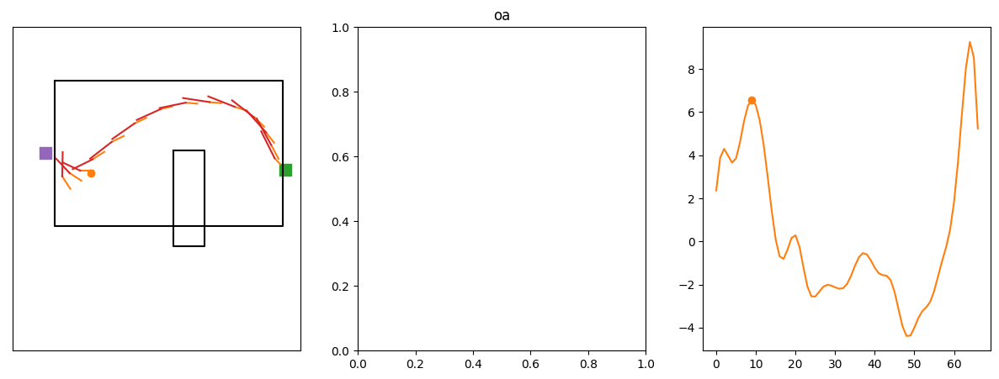

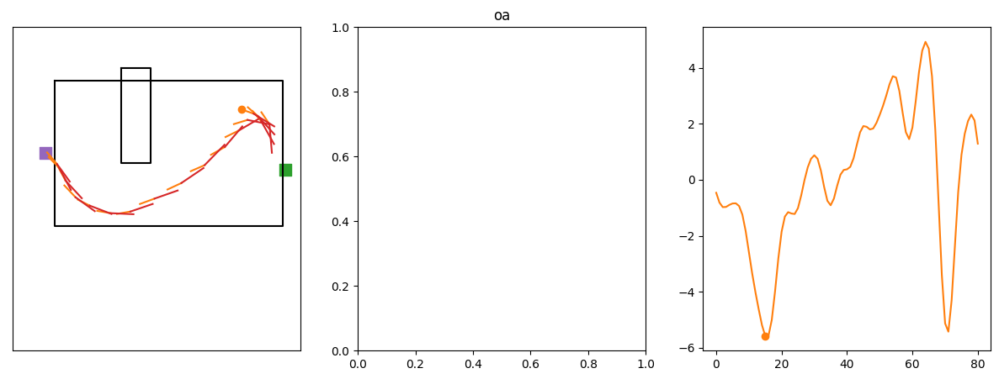

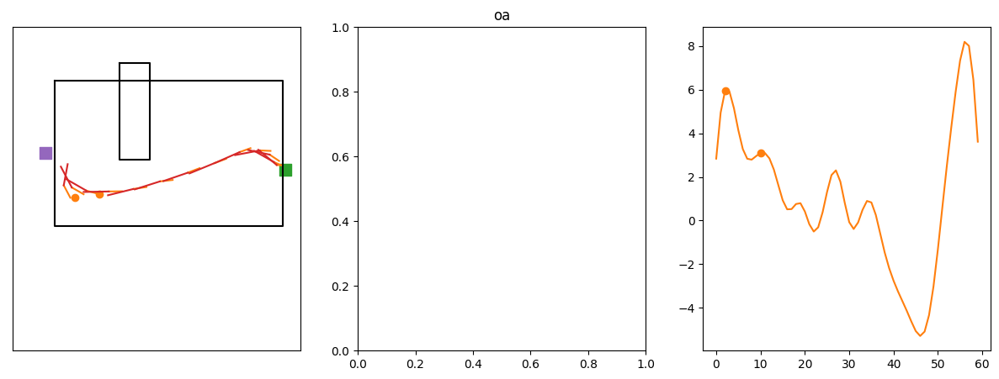

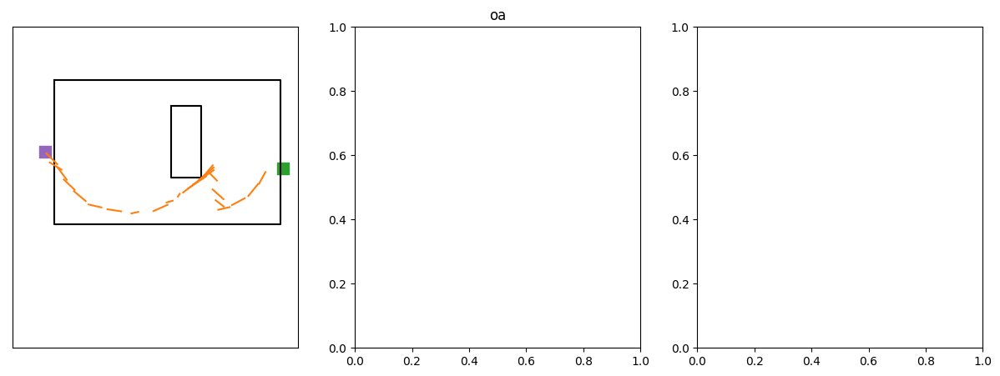

In [72]:
test1 = test1 = con[(con.animal == 'J675NN') & (con.date == '022024')]

test1 = test1.sample(60)
#test1 = test1[test1.num_turn >= 3].sample(50)


for ind,row in test1.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(15,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    


    trial_df = test1.loc[[ind]]
    plot_arena(test1,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



   
    ax[1].set_title(str(row.task) )
 


    

  
    ax[0].plot((row.ts_nose_x_cm[::5],row.ts_spine_x_cm[::5]),(row.ts_nose_y_cm[::5],row.ts_spine_y_cm[::5]),color = 'tab:orange')
    ax[0].scatter((row.ts_nose_x_cm)[row.distance_at_head_turn_2_indexs.tolist()],(row.ts_nose_y_cm)[row.distance_at_head_turn_2_indexs.tolist()],color = 'tab:orange')
    ax[0].plot((row.ts_spine_x_cm[::5],row.ts_tailbase_x_cm[::5]),(row.ts_spine_y_cm[::5],row.ts_tailbase_y_cm[::5]),color = 'tab:red')
    ax[2].plot(row.head_angle_velocity,color = 'tab:orange')
    ax[2].scatter(row.distance_at_head_turn_2_indexs.tolist(),(row.head_angle_velocity)[row.distance_at_head_turn_2_indexs.tolist()],color = 'tab:orange')
    #ax[1].set_ylim(0,180)

In [77]:
test = mon[(mon.animal == 'J675NN') & (mon.date == '022124')]

test = test.sample(60)
#test = test[test.num_turn >= 3].sample(50)


for ind,row in test.iterrows():
    
        
    fig,ax = plt.subplots(1,3,figsize=(15,5))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
   
    


    trial_df = test.loc[[ind]]
    plot_arena(test,ax[0])
    plot_orginal_obstacle(trial_df,ax[0],int(row.obstacle_cluster))



   
    ax[1].set_title(str(row.task) )
 


    

  
    ax[0].plot((row.ts_nose_x_cm[::5],row.ts_spine_x_cm[::5]),(row.ts_nose_y_cm[::5],row.ts_spine_y_cm[::5]),color = 'tab:orange')
    ax[0].scatter((row.ts_nose_x_cm)[row.distance_at_head_turn_2_indexs.tolist()],(row.ts_nose_y_cm)[row.distance_at_head_turn_2_indexs.tolist()],color = 'tab:orange')
    ax[0].plot((row.ts_spine_x_cm[::5],row.ts_tailbase_x_cm[::5]),(row.ts_spine_y_cm[::5],row.ts_tailbase_y_cm[::5]),color = 'tab:red')
    ax[1].plot(row.ts_speed)
    ax[2].plot(row.head_angle_velocity,color = 'tab:orange')
    ax[2].scatter(row.distance_at_head_turn_2_indexs.tolist(),(row.head_angle_velocity)[row.distance_at_head_turn_2_indexs.tolist()],color = 'tab:orange')
    #ax[1].set_ylim(0,180)


In [65]:
row.ts_nose_x_cm[row.distance_at_head_turn_2_indexs.tolist()]

array([50.05472425529391, 26.04440782582231], dtype=object)